In [1]:
# IMPORTS
import numpy as np
import pandas as pd
import scipy
import scipy.sparse
import scanpy as sc
import scvelo as scv
import anndata
import seaborn as sns
import palantir
import os

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
import matplotlib.font_manager as fm
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from matplotlib.lines import Line2D
import matplotlib.cm as cm
import plotly.graph_objects as go

from adjustText import adjust_text
from scipy.stats import spearmanr
from scipy.spatial.distance import pdist, squareform

import cellrank as cr
from moscot.problems.time import TemporalProblem
from cellrank.kernels import RealTimeKernel, PseudotimeKernel

In [2]:
# SETTINGS
sc.settings.set_figure_params(dpi=70)
sc.settings.verbosity = 1
sc.logging.print_version_and_date()
print(matplotlib.__version__)

FIGSIZE_SINGLE = (6, 6)
FIGSIZE_WIDE = (9, 6)
plt.rcParams["figure.figsize"] = list(FIGSIZE_SINGLE)

for name, cols in [
    ("custom_wbr",  ["#FFFFFF", "#006199", "#DA4948"]),
    ("custom_bbyr", ["#0c0d0c", "#006199", "#EED365", "#DA4948"]),
    ("custom_br",   ["#006199", "#DA4948"]),
    ("custom_btr",  ["#006199", "#70c269", "#DA4948"]),
    ("custom_btry", ["#006199", "#70c269", "#EED365", "#DA4948"]),
]:
    cmap = LinearSegmentedColormap.from_list(name, cols)
    plt.colormaps.register(name=name, cmap=cmap)

font_path = "/home/uvictor/BAHNSCHRIFT.TTF"
fm.fontManager.addfont(font_path)
fm._load_fontmanager(try_read_cache=False)
plt.rcParams["font.family"] = "bahnschrift"
matplotlib.rcParams["axes.unicode_minus"] = False

Running Scanpy 1.12.1, on 2026-05-06 22:39.
3.10.9


In [3]:
# PATHS
path = "/home/uvictor/ubels26_hair_cycle/"
print(os.listdir(path))

output_dir = os.path.join(path, "cellrank/dp/")
os.makedirs(output_dir, exist_ok=True)

['scatac_files', '.gitattributes', '.git', 'marker_genes', 'cell_communication_results', 'cellrank', 'plots', 'annotated_vis_obj.rds', 'preprocessing', 'renv.lock', 'enrichment_plots', 'velocity_output', '.Rhistory', 'post_filter_nonintegrated_objects.RDS', 'obj_anndata.h5ad', 'umap_hierarchical.svg', 'post_filter_integrated_objects.RDS', 'Spatial_scalp_S2_final.rds', 'renv', 'annotated_obj.rds', 'ubels26_hair_cycle.Rproj', '.Rproj.user', '.gitignore', '.Rprofile', 'broad_annotated_obj.rds', 'scripts', 'spatial_trajectory', 'object_list.RDS']


In [4]:
# LOAD AND SUBSET
adata = anndata.read_h5ad(os.path.join(path, "obj_anndata.h5ad"))

clusters_to_keep = [
    "DP.Qui", "DP.Ind", "DP.Remod", "DP.Str"]
adata_dp = adata[adata.obs["fine_clust"].isin(clusters_to_keep)].copy()

print("Clusters in subset:", adata_dp.obs["fine_clust"].unique())
print("Original cells:", adata.n_obs)
print("Cells in subset:", adata_dp.n_obs)

Clusters in subset: ['DP.Ind', 'DP.Str', 'DP.Qui', 'DP.Remod']
Categories (4, object): ['DP.Ind', 'DP.Qui', 'DP.Remod', 'DP.Str']
Original cells: 18659
Cells in subset: 657


In [5]:
# UTILITY FUNCTIONS

def _style_embedding_ax(ax, title, title_fontsize=25, label_fontsize=15):
    ax.axis("on")
    for spine in ax.spines.values():
        spine.set_visible(False)
    ax.set_title(title, fontsize=title_fontsize)
    ax.set_xlabel("t-SNE 1", fontsize=label_fontsize)
    ax.set_ylabel("t-SNE 2", fontsize=label_fontsize)
    ax.xaxis.set_label_coords(0.17, 0.03)
    ax.yaxis.set_label_coords(0.03, 0.17)
    ax.set_xticks([])
    ax.set_yticks([])
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()
    arrow_props = dict(head_width=3, head_length=1.5, fc="k", ec="k")
    ax.arrow(xmin, ymin, (xmax - xmin) / 4, 0, **arrow_props)
    ax.arrow(xmin, ymin, 0, (ymax - ymin) / 4, **arrow_props)



def plot_tsne_with_labels(adata, color_var, plot_title, legend_fontsize=20, figsize=FIGSIZE_SINGLE):
    with plt.rc_context({"figure.figsize": figsize, "figure.frameon": False}):
        ax = sc.pl.tsne(adata, color=[color_var], show=False, frameon=True)
        ax.get_legend().remove()
        _style_embedding_ax(ax, plot_title)

        texts = []
        for group in adata.obs[color_var].unique():
            mask = adata.obs[color_var] == group
            x = adata.obsm["X_tsne"][mask, 0].mean()
            y = adata.obsm["X_tsne"][mask, 1].mean()
            text = ax.text(
                x, y, str(group),
                fontsize=legend_fontsize,
                path_effects=[pe.withStroke(linewidth=1, foreground="darkgray")],
                ha="center", va="center",
            )
            texts.append(text)

        adjust_text(
            texts,
            expand_points=(1.2, 1.2),
            force_points=(0.5, 0.5),
            arrowprops=dict(arrowstyle="-", color="black", lw=0.5),
        )
        return ax


def plot_paga_on_tsne(adata, color_var="fine_clust", plot_title="PAGA overlay on t-SNE",
                      figsize=FIGSIZE_SINGLE, legend_fontsize=18, save_fig=False):
    if "paga" not in adata.uns:
        raise ValueError("Run sc.tl.paga() first.")
    if "X_tsne" not in adata.obsm:
        raise ValueError("Run sc.tl.tsne() first.")

    fig, ax = plt.subplots(figsize=figsize)
    sc.pl.tsne(adata, color=color_var, size=50, alpha=0.5,
               show=False, title="", ax=ax, legend_loc=None)

    pos = np.zeros((len(adata.obs[color_var].cat.categories), 2))
    for i, cat in enumerate(adata.obs[color_var].cat.categories):
        mask = adata.obs[color_var] == cat
        pos[i] = np.mean(adata.obsm["X_tsne"][mask], axis=0)

    connectivities = adata.uns["paga"]["connectivities"].tocsr()
    for i in range(connectivities.shape[0]):
        for j in range(connectivities.shape[1]):
            if connectivities[i, j] > 0:
                ax.plot(
                    [pos[i, 0], pos[j, 0]],
                    [pos[i, 1], pos[j, 1]],
                    "-", color="black",
                    linewidth=connectivities[i, j] * 6,
                    alpha=0.5,
                )

    ax.scatter(pos[:, 0], pos[:, 1], s=200, c="white", edgecolor="black", zorder=3)
    _style_embedding_ax(ax, plot_title, title_fontsize=25)
    ax.set_title(plot_title, fontsize=25, pad=15)

    center = np.mean(pos, axis=0)
    texts = []
    for i, cat in enumerate(adata.obs[color_var].cat.categories):
        vec = np.array([pos[i, 0] - center[0], pos[i, 1] - center[1]])
        offset_distance = 18
        if np.any(vec):
            vec = vec / np.sqrt(np.sum(vec**2)) * offset_distance
        text = ax.text(
            pos[i, 0] + vec[0], pos[i, 1] + vec[1], str(cat),
            fontsize=legend_fontsize,
            path_effects=[pe.withStroke(linewidth=1, foreground="darkgray")],
            ha="center", va="center",
        )
        texts.append(text)

    if save_fig:
        plt.savefig("PAGA_on_TSNE.png", bbox_inches="tight")
    return ax


def plot_embedding_pseudotime(adata, color_var, plot_title, figsize=FIGSIZE_SINGLE):
    with plt.rc_context({"figure.figsize": figsize, "figure.frameon": False}):
        ax = sc.pl.embedding(
            adata, color=color_var, basis="X_tsne",
            show=False, frameon=True, cmap="custom_btry", title=plot_title,
        )
        _style_embedding_ax(ax, plot_title)
        return ax


def plot_random_walk_tsne(tmk_obj, plot_title, figsize=FIGSIZE_SINGLE):
    tmk_obj.plot_random_walks(
        max_iter=20, n_sims=5000,
        start_ixs={"hair_cycle_numeric": 0.0},
        basis="tsne", seed=0, figsize=figsize,
        frameon=True, cmap="custom_wbr",
    )
    ax = plt.gca()
    _style_embedding_ax(ax, plot_title)
    return ax


def plot_macrostates_tsne(adata, estimator, plot_title, figsize=FIGSIZE_SINGLE):
    estimator.plot_macrostates(which="all", discrete=False, basis="tsne", show=False)
    adata.obs["macrostates"] = estimator.macrostates.copy()
    ax = plt.gca()
    _style_embedding_ax(ax, plot_title)
    return ax


def filter_genes(adata, blacklist_patterns=["MT-", "RPL", "RPS"]):
    gene_names = adata.var_names.str.upper()
    keep_genes = np.ones(len(gene_names), dtype=bool)
    for pattern in blacklist_patterns:
        keep_genes &= ~gene_names.str.startswith(pattern.upper())
    return keep_genes


def calculate_gene_expression_similarity(adata, clusters, n_top_genes=1000):
    adata_f = adata.copy()
    adata_f = adata_f[:, filter_genes(adata_f)]

    if "highly_variable" not in adata_f.var:
        sc.pp.highly_variable_genes(adata_f, n_top_genes=n_top_genes, flavor="seurat")
    top_genes = adata_f.var_names[adata_f.var.highly_variable][:n_top_genes].tolist()

    cluster_means = {}
    for cl in clusters:
        cells = adata_f[adata_f.obs["fine_clust"] == cl]
        mean_expr = cells[:, top_genes].X.mean(axis=0)
        if scipy.sparse.issparse(mean_expr):
            mean_expr = mean_expr.A.flatten()
        cluster_means[cl] = np.asarray(mean_expr).flatten()

    expr_mat = np.vstack([cluster_means[cl] for cl in clusters])
    corr = np.corrcoef(expr_mat)
    sim = (corr + 1) / 2

    sim_df = pd.DataFrame(sim, index=clusters, columns=clusters)
    return sim_df, top_genes


def plot_expression_similarity_heatmap(similarity_df, figsize=(12, 10), vmin=0.7, vmax=1.0):
    g = sns.clustermap(
        similarity_df, annot=True, fmt=".2f", cmap="custom_wbr",
        square=True, vmin=vmin, vmax=vmax,
        dendrogram_ratio=0.1, tree_kws={"linewidth": 2},
        row_colors=None, colors_ratio=0,
    )
    g.cax.set_visible(False)
    g.fig.suptitle(
        "Cluster Expression Similarity Heatmap\n"
        "(Based on Top 1000 Variable Genes\n"
        "Excluding MT-, RPL, and RPS genes)",
        y=1.02, fontsize=20,
    )
    plt.tight_layout()
    return g.fig


def analyze_cluster_genes(adata, clusters, n_genes_display=10):
    adata_f = adata[:, filter_genes(adata)].copy()
    results = []
    for cluster in clusters:
        sc.tl.rank_genes_groups(
            adata_f, groupby="fine_clust",
            groups=[cluster], reference="rest", method="wilcoxon",
        )
        top = sc.get.rank_genes_groups_df(adata_f, group=cluster).head(n_genes_display)
        results.append({
            "cluster": cluster,
            "top_genes": top["names"].tolist(),
            "scores": top["scores"].tolist(),
            "log2fc": top["logfoldchanges"].tolist(),
        })
    return results


def create_custom_trajectory(adata, cluster_order, cluster_col="macrostates",
                             basis="X_tsne", sigma=0.1):
    if basis not in adata.obsm:
        raise KeyError(f"'{basis}' not found in adata.obsm. Available: {list(adata.obsm.keys())}")

    ordered_clusters = [k for k, v in sorted(cluster_order.items(), key=lambda x: x[1])]
    coords = adata.obsm[basis]

    centroids = {}
    for cl in ordered_clusters:
        mask = adata.obs[cluster_col] == cl
        if mask.any():
            centroids[cl] = coords[mask].mean(axis=0)

    ordered_centroids = np.vstack([centroids[cl] for cl in ordered_clusters])

    centroid_dists = np.cumsum([0] + [
        np.linalg.norm(ordered_centroids[i] - ordered_centroids[i - 1])
        for i in range(1, len(ordered_centroids))
    ])
    centroid_positions = centroid_dists / centroid_dists[-1]

    def _point_to_segment(point, start, end):
        seg = end - start
        length_sq = np.sum(seg**2)
        if length_sq == 0:
            return np.linalg.norm(point - start), 0.0, start
        t = max(0, min(1, np.sum((point - start) * seg) / length_sq))
        proj = start + t * seg
        return np.linalg.norm(point - proj), t, proj

    pseudotime = np.zeros(len(adata))
    for i in range(len(coords)):
        min_dist = float("inf")
        best_time = 0
        for j in range(len(ordered_centroids) - 1):
            dist, t, _ = _point_to_segment(coords[i], ordered_centroids[j], ordered_centroids[j + 1])
            if dist < min_dist:
                min_dist = dist
                best_time = centroid_positions[j] * (1 - t) + centroid_positions[j + 1] * t
        pseudotime[i] = best_time

    adata.obs["trajectory_order"] = adata.obs[cluster_col].map(cluster_order)
    adata.obs["custom_pseudotime"] = pseudotime
    adata.uns["trajectory_centroids"] = {
        "coordinates": ordered_centroids,
        "pseudotime": centroid_positions,
    }
    return adata

def get_gene_peak_position(adata, gene, pseudotime_key, basis="X_tsne", top_frac=0.15):
    gene_idx = list(adata.var_names).index(gene)

    if "MAGIC_imputed_data" in adata.layers:
        x = adata.layers["MAGIC_imputed_data"][:, gene_idx]
    else:
        x = adata.X[:, gene_idx]

    if scipy.sparse.issparse(x):
        expr = np.asarray(x.todense()).flatten()
    else:
        expr = np.asarray(x).flatten()

    pt = adata.obs[pseudotime_key].values
    valid = ~np.isnan(pt) & (expr > 0)
    expr = expr[valid]
    pt = pt[valid]
    coords = adata.obsm[basis][valid]

    if len(expr) == 0 or expr.sum() == 0:
        return None

    n_top = max(10, int(len(expr) * top_frac))
    top_idx = np.argsort(expr)[-n_top:]

    expr_top = expr[top_idx]
    pt_top = pt[top_idx]
    coords_top = coords[top_idx]

    weights = expr_top / expr_top.sum()
    peak_pt = np.average(pt_top, weights=weights)
    centroid_x = np.average(coords_top[:, 0], weights=weights)
    centroid_y = np.average(coords_top[:, 1], weights=weights)

    return {"gene": gene, "peak_pt": peak_pt, "x": centroid_x, "y": centroid_y}


def _collect_genes(adata, macrostate_drivers, ordered_states, pseudotime_key,
                   custom_genes, seen_genes, n_genes_per_state, top_frac,
                   blacklist_prefixes, interpolate_fn):
    gene_positions = []

    for state in ordered_states:
        if state not in macrostate_drivers:
            continue
        count = 0
        for gene in macrostate_drivers[state]:
            if gene in seen_genes:
                continue
            if any(gene.startswith(p) for p in blacklist_prefixes):
                continue
            if gene not in adata.var_names:
                continue

            peak = get_gene_peak_position(adata, gene, pseudotime_key, top_frac=top_frac)
            if peak is None:
                continue

            xy = interpolate_fn(peak["peak_pt"])
            gene_positions.append({
                "gene": gene, "peak_pt": peak["peak_pt"],
                "x": xy[0], "y": xy[1],
            })
            seen_genes.add(gene)
            count += 1
            if count >= n_genes_per_state:
                break

    if custom_genes:
        for gene in custom_genes:
            if gene in seen_genes:
                continue
            if gene not in adata.var_names:
                print(f"  Skipping {gene} — not in var_names")
                continue

            peak = get_gene_peak_position(adata, gene, pseudotime_key, top_frac=top_frac)
            if peak is None:
                print(f"  Skipping {gene} — no expression")
                continue

            xy = interpolate_fn(peak["peak_pt"])
            gene_positions.append({
                "gene": gene, "peak_pt": peak["peak_pt"],
                "x": xy[0], "y": xy[1],
            })
            seen_genes.add(gene)

    return gene_positions


def _draw_spine(spine_coords, spine_states_sorted, trajectory_color, ax, close_loop=False):
    n = len(spine_coords)
    loop_range = n if close_loop else n - 1
    for i in range(loop_range):
        p0 = spine_coords[i]
        p1 = spine_coords[(i + 1) % n]
        ax.annotate(
            "", xy=(p1[0], p1[1]), xytext=(p0[0], p0[1]),
            arrowprops=dict(arrowstyle="-|>", color=trajectory_color,
                            lw=5, mutation_scale=28, alpha=0.3),
            zorder=3,
        )
    for i, state in enumerate(spine_states_sorted):
        cx, cy = spine_coords[i]
        ax.scatter(cx, cy, s=120, c="white", edgecolors=trajectory_color,
                   linewidths=2, zorder=5, alpha=0.8)
        ax.text(
            cx, cy - 3, state,
            fontsize=5, fontstyle="italic", color="gray",
            ha="center", va="top",
            path_effects=[pe.withStroke(linewidth=2, foreground="white")],
            zorder=7,
        )


def _draw_genes(gene_positions, trajectory_color, ax, close_loop=False):
    for i in range(len(gene_positions) - 1):
        gp0, gp1 = gene_positions[i], gene_positions[i + 1]
        ax.annotate(
            "", xy=(gp1["x"], gp1["y"]),
            xytext=(gp0["x"], gp0["y"]),
            arrowprops=dict(arrowstyle="-|>", color=trajectory_color,
                            lw=2.5, mutation_scale=16, alpha=0.6),
            zorder=4,
        )
    if close_loop and len(gene_positions) >= 2:
        ax.annotate(
            "", xy=(gene_positions[0]["x"], gene_positions[0]["y"]),
            xytext=(gene_positions[-1]["x"], gene_positions[-1]["y"]),
            arrowprops=dict(arrowstyle="-|>", color=trajectory_color,
                            lw=2.5, mutation_scale=16, alpha=0.4,
                            linestyle="dashed"),
            zorder=4,
        )
    texts = []
    for gp in gene_positions:
        ax.scatter(gp["x"], gp["y"], s=60, c=trajectory_color,
                   edgecolors="black", linewidths=1.2, zorder=6, marker="o")
        text = ax.text(
            gp["x"], gp["y"], gp["gene"],
            fontsize=9, fontweight="bold",
            ha="center", va="bottom",
            path_effects=[pe.withStroke(linewidth=3, foreground="white")],
            zorder=8,
        )
        texts.append(text)
    adjust_text(
        texts,
        expand_points=(1.8, 1.8),
        force_points=(1.0, 1.0),
        arrowprops=dict(arrowstyle="-", color="gray", lw=0.5),
    )


def plot_cyclic_gene_chain(adata, macrostate_drivers, trajectory_order,
                           trajectory_color, ax, pseudotime_key,
                           custom_genes=None,
                           macrostate_col="macrostates",
                           n_genes_per_state=3, top_frac=0.15,
                           blacklist_prefixes=("ENSG", "LINC", "LOC", "AC0", "AL0")):

    ordered_states = [k for k, v in sorted(trajectory_order.items(), key=lambda x: x[1])]

    centroids, state_mean_pt = {}, {}
    for state in ordered_states:
        mask = adata.obs[macrostate_col] == state
        if not mask.any():
            continue
        centroids[state] = adata[mask].obsm["X_tsne"].mean(axis=0)
        pt_vals = adata.obs.loc[mask, pseudotime_key].dropna()
        if len(pt_vals) > 0:
            state_mean_pt[state] = pt_vals.mean()

    spine_states = [s for s in ordered_states if s in centroids and s in state_mean_pt]
    spine_coords = np.array([centroids[s] for s in spine_states])
    spine_pts = np.array([state_mean_pt[s] for s in spine_states])

    sort_idx = np.argsort(spine_pts)
    spine_coords = spine_coords[sort_idx]
    spine_pts = spine_pts[sort_idx]
    spine_states_sorted = [spine_states[i] for i in sort_idx]

    n_spine = len(spine_coords)
    seg_lengths = np.array([
        np.linalg.norm(spine_coords[(i + 1) % n_spine] - spine_coords[i])
        for i in range(n_spine)
    ])
    total_length = seg_lengths.sum()
    cum_arc = np.cumsum(np.concatenate([[0], seg_lengths[:-1]]))

    pt_min, pt_max = spine_pts[0], spine_pts[-1]
    pt_range = pt_max - pt_min if pt_max > pt_min else 1.0

    def interpolate_on_loop(pt_val):
        frac = np.clip((pt_val - pt_min) / pt_range, 0, 1) * (1 - 1e-6)
        arc_target = frac * total_length
        for i in range(n_spine):
            seg_end = cum_arc[i] + seg_lengths[i]
            if arc_target <= seg_end or i == n_spine - 1:
                t = (arc_target - cum_arc[i]) / (seg_lengths[i] + 1e-12)
                t = np.clip(t, 0, 1)
                return spine_coords[i] * (1 - t) + spine_coords[(i + 1) % n_spine] * t
        return spine_coords[0]

    _draw_spine(spine_coords, spine_states_sorted, trajectory_color, ax, close_loop=True)

    seen = set()
    gene_positions = _collect_genes(
        adata, macrostate_drivers, spine_states_sorted, pseudotime_key,
        custom_genes, seen, n_genes_per_state, top_frac,
        blacklist_prefixes, interpolate_on_loop,
    )
    gene_positions = sorted(gene_positions, key=lambda p: p["peak_pt"])

    _draw_genes(gene_positions, trajectory_color, ax, close_loop=True)
    return gene_positions


def plot_linear_gene_chain(adata, macrostate_drivers, trajectory_order,
                           trajectory_color, ax, pseudotime_key,
                           custom_genes=None,
                           macrostate_col="macrostates",
                           n_genes_per_state=3, top_frac=0.15,
                           blacklist_prefixes=("ENSG", "LINC", "LOC", "AC0", "AL0")):

    ordered_states = [k for k, v in sorted(trajectory_order.items(), key=lambda x: x[1])]

    centroids, state_mean_pt = {}, {}
    for state in ordered_states:
        mask = adata.obs[macrostate_col] == state
        if not mask.any():
            continue
        centroids[state] = adata[mask].obsm["X_tsne"].mean(axis=0)
        pt_vals = adata.obs.loc[mask, pseudotime_key].dropna()
        if len(pt_vals) > 0:
            state_mean_pt[state] = pt_vals.mean()

    spine_states = [s for s in ordered_states if s in centroids and s in state_mean_pt]
    spine_coords = np.array([centroids[s] for s in spine_states])
    spine_pts = np.array([state_mean_pt[s] for s in spine_states])

    sort_idx = np.argsort(spine_pts)
    spine_coords = spine_coords[sort_idx]
    spine_pts = spine_pts[sort_idx]
    spine_states_sorted = [spine_states[i] for i in sort_idx]

    def interpolate_on_spine(pt_val):
        if pt_val <= spine_pts[0]:
            return spine_coords[0]
        if pt_val >= spine_pts[-1]:
            return spine_coords[-1]
        idx = np.searchsorted(spine_pts, pt_val) - 1
        idx = max(0, min(idx, len(spine_pts) - 2))
        t = (pt_val - spine_pts[idx]) / (spine_pts[idx + 1] - spine_pts[idx] + 1e-12)
        return spine_coords[idx] * (1 - t) + spine_coords[idx + 1] * t

    _draw_spine(spine_coords, spine_states_sorted, trajectory_color, ax, close_loop=False)

    seen = set()
    gene_positions = _collect_genes(
        adata, macrostate_drivers, spine_states_sorted, pseudotime_key,
        custom_genes, seen, n_genes_per_state, top_frac,
        blacklist_prefixes, interpolate_on_spine,
    )
    gene_positions = sorted(gene_positions, key=lambda p: p["peak_pt"])

    _draw_genes(gene_positions, trajectory_color, ax, close_loop=False)
    return gene_positions

In [6]:
# PREPROCESSING
sc.tl.tsne(adata_dp)
sc.pp.neighbors(adata_dp)
sc.tl.paga(adata_dp, groups="fine_clust")

Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


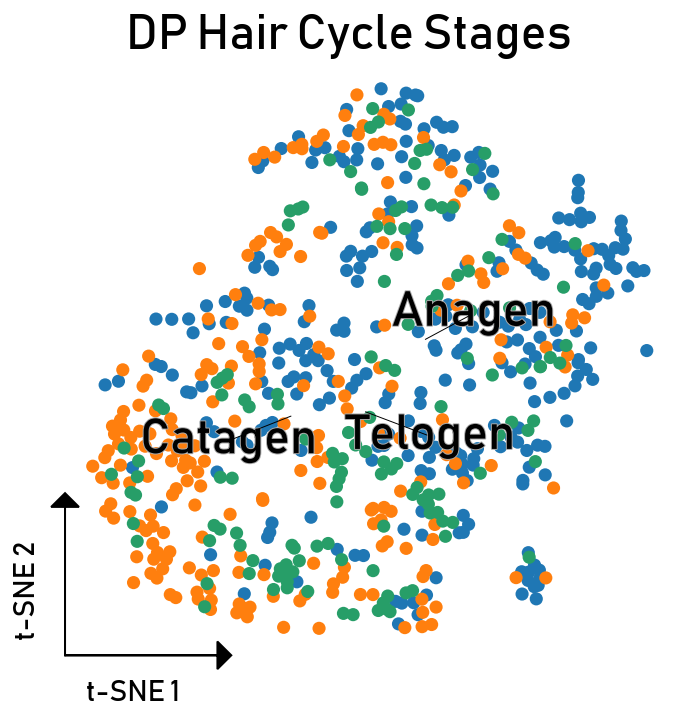

In [7]:
# TSNE — HAIR CYCLE STAGES
ax = plot_tsne_with_labels(
    adata_dp, color_var="orig.ident",
    plot_title="DP Hair Cycle Stages", legend_fontsize=25,
)
plt.savefig(os.path.join(output_dir, "DP_HairCycleStages.png"), bbox_inches="tight")

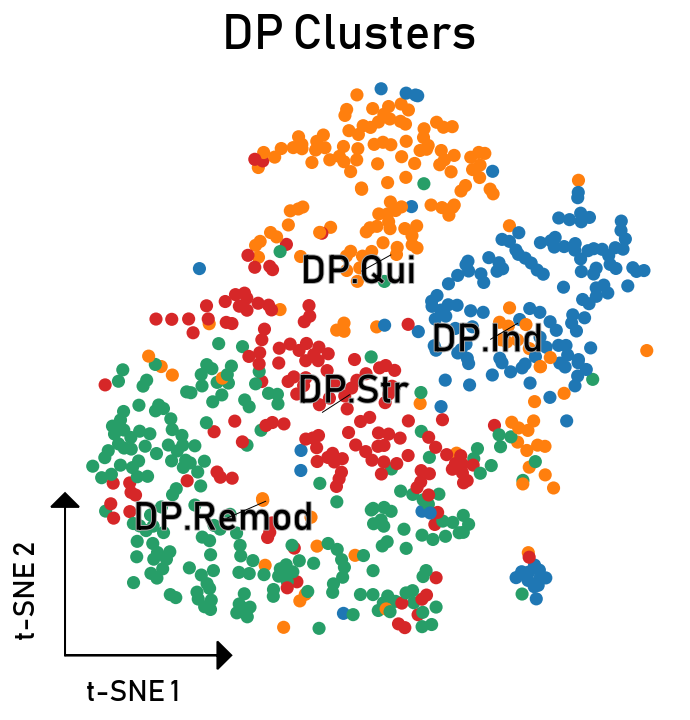

In [8]:
# TSNE — CLUSTERS
ax = plot_tsne_with_labels(
    adata_dp, color_var="fine_clust",
    plot_title="DP Clusters", legend_fontsize=20,
)
plt.savefig(os.path.join(output_dir, "DP_Clusters.png"), bbox_inches="tight")

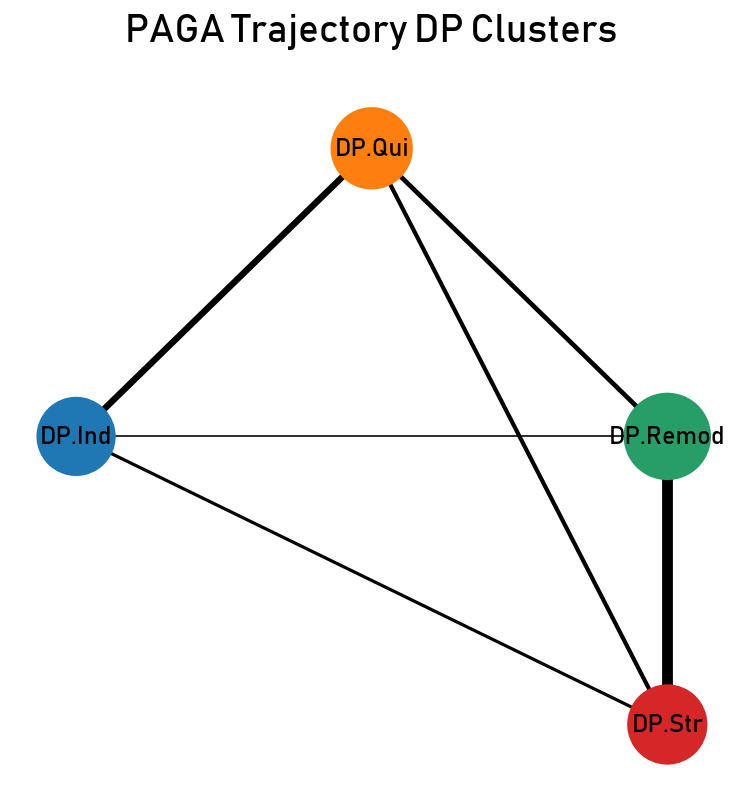

In [9]:
# PAGA GRAPH
ax = sc.pl.paga(
    adata_dp, node_size_power=0.5, node_size_scale=10,
    layout="rt", root=1, frameon=False,
    save=False, show=False,
    title="PAGA Trajectory DP Clusters",
)
ax.set_title("PAGA Trajectory DP Clusters", fontsize=20, y=1.05)
plt.savefig(os.path.join(output_dir, "DP_PAGATrajectories.png"), bbox_inches="tight")

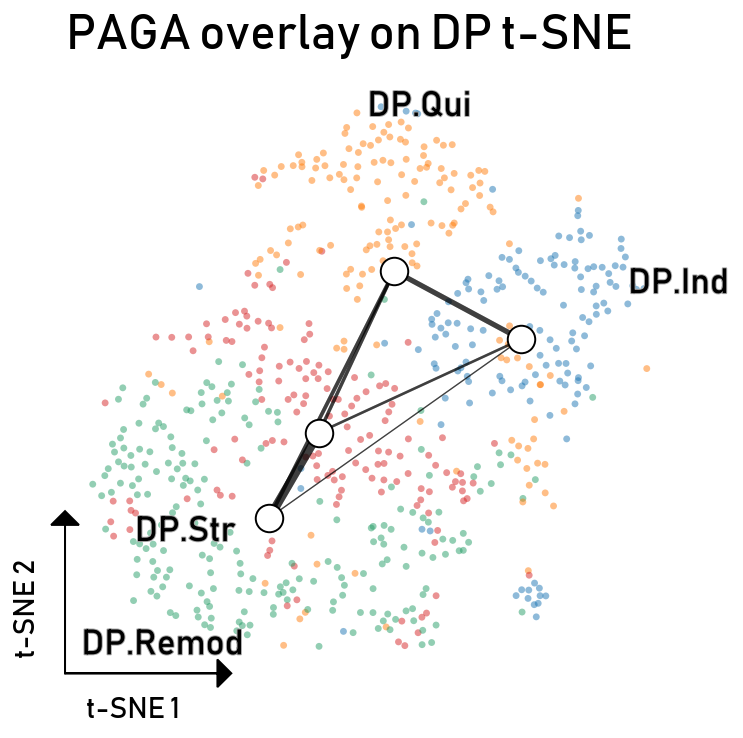

In [10]:
# PAGA OVERLAY ON TSNE
sc.tl.paga(adata_dp, groups="fine_clust")
ax = plot_paga_on_tsne(
    adata_dp, color_var="fine_clust",
    plot_title="PAGA overlay on DP t-SNE",
)
plt.savefig(os.path.join(output_dir, "DP_PAGA_Overlay.png"), bbox_inches="tight")
plt.show()

In [11]:
# DIFFUSION PSEUDOTIME
root_cell = "_Telogen_TACCCCATCCGGTTAA-1"

adata_dp.uns["iroot"] = int(
    adata_dp.obs_names.get_loc(root_cell)
)
sc.tl.diffmap(adata_dp)
sc.tl.dpt(adata_dp)

In [12]:
# PALANTIR PSEUDOTIME
dm_res = palantir.utils.run_diffusion_maps(adata_dp, n_components=5)
ms_data = palantir.utils.determine_multiscale_space(adata_dp)

pr_res = palantir.core.run_palantir(
    adata_dp,
    early_cell=root_cell,
    num_waypoints=500,
    use_early_cell_as_start=True,
)

Sampling and flocking waypoints...
Time for determining waypoints: 5.670388539632162e-05 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.0021486282348632812 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9998
Correlation at iteration 2: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


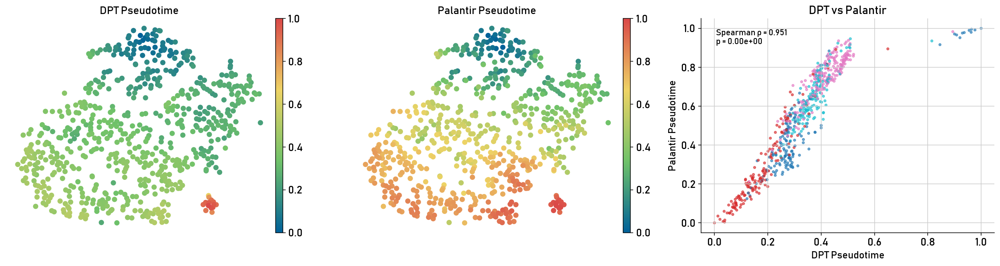

In [13]:
# DPT VS PALANTIR COMPARISON
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

sc.pl.embedding(
    adata_dp, basis="X_tsne", color="dpt_pseudotime",
    ax=axes[0], show=False, cmap="custom_btry",
    title="DPT Pseudotime", frameon=False,
)

sc.pl.embedding(
    adata_dp, basis="X_tsne", color="palantir_pseudotime",
    ax=axes[1], show=False, cmap="custom_btry",
    title="Palantir Pseudotime", frameon=False,
)

axes[2].scatter(
    adata_dp.obs["dpt_pseudotime"],
    adata_dp.obs["palantir_pseudotime"],
    c=adata_dp.obs["fine_clust"].cat.codes,
    cmap="tab10", s=8, alpha=0.6,
)
axes[2].set_xlabel("DPT Pseudotime", fontsize=13)
axes[2].set_ylabel("Palantir Pseudotime", fontsize=13)
axes[2].set_title("DPT vs Palantir", fontsize=15)

rho, pval = spearmanr(
    adata_dp.obs["dpt_pseudotime"],
    adata_dp.obs["palantir_pseudotime"],
)
axes[2].text(
    0.05, 0.95, f"Spearman ρ = {rho:.3f}\np = {pval:.2e}",
    transform=axes[2].transAxes, fontsize=11,
    verticalalignment="top",
)

plt.tight_layout()
plt.savefig(os.path.join(output_dir, "DPT_vs_Palantir_comparison.png"),
            dpi=300, bbox_inches="tight")
plt.show()

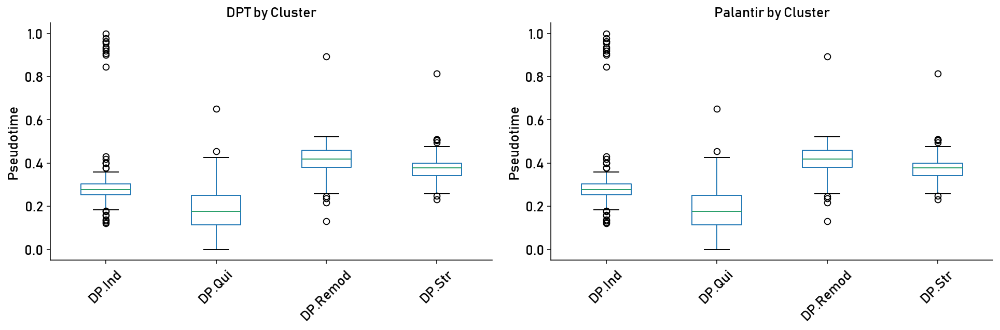

In [14]:
# PER-CLUSTER PSEUDOTIME DISTRIBUTIONS
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

adata_dp.obs.boxplot(
    column="dpt_pseudotime", by="fine_clust",
    ax=axes[0], rot=45, grid=False,
)
axes[0].set_title("DPT by Cluster", fontsize=14)
axes[0].set_xlabel("")
axes[0].set_ylabel("Pseudotime")

adata_dp.obs.boxplot(
    column="dpt_pseudotime", by="fine_clust",
    ax=axes[1], rot=45, grid=False,
)
axes[1].set_title("Palantir by Cluster", fontsize=14)
axes[1].set_xlabel("")
axes[1].set_ylabel("Pseudotime")

fig.suptitle("")
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "pseudotime_boxplots_by_cluster.png"),
            dpi=300, bbox_inches="tight")
plt.show()

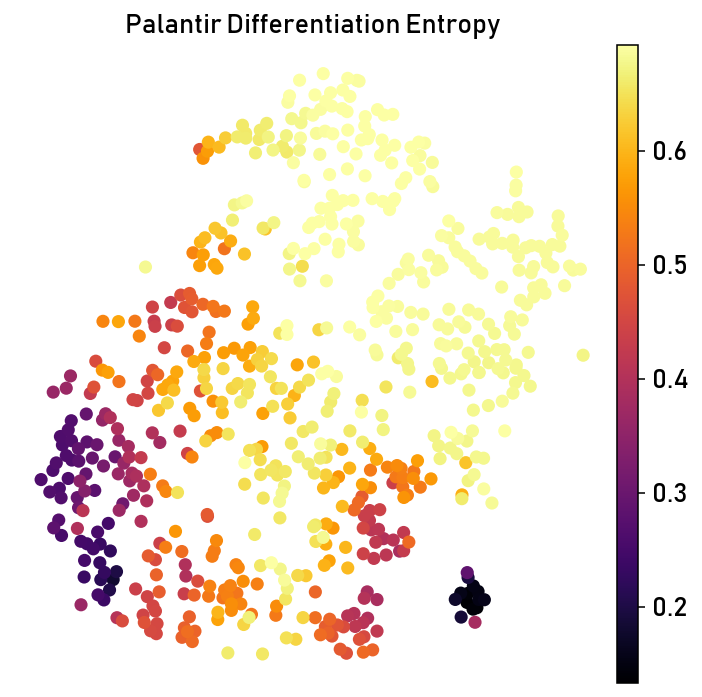

In [15]:
# ENTROPY OF DIFFERENTIATION
if "palantir_entropy" in adata_dp.obs.columns:
    fig, ax = plt.subplots(figsize=FIGSIZE_SINGLE)
    sc.pl.embedding(
        adata_dp, basis="X_tsne", color="palantir_entropy",
        ax=ax, show=False, cmap="inferno",
        title="Palantir Differentiation Entropy", frameon=False,
    )
    plt.savefig(os.path.join(output_dir, "palantir_entropy.png"),
                dpi=300, bbox_inches="tight")
    plt.show()

In [16]:
# SWAP TO PALANTIR PSEUDOTIME
adata_dp.obs["dpt_pseudotime_original"] = adata_dp.obs["dpt_pseudotime"].copy()
adata_dp.obs["dpt_pseudotime"] = adata_dp.obs["palantir_pseudotime"].copy()

/home/uvictor/miniconda3/envs/ubels26_haircycle/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:805: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}
/home/uvictor/miniconda3/envs/ubels26_haircycle/lib/python3.12/site-packages/seaborn/matrix.py:1124: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


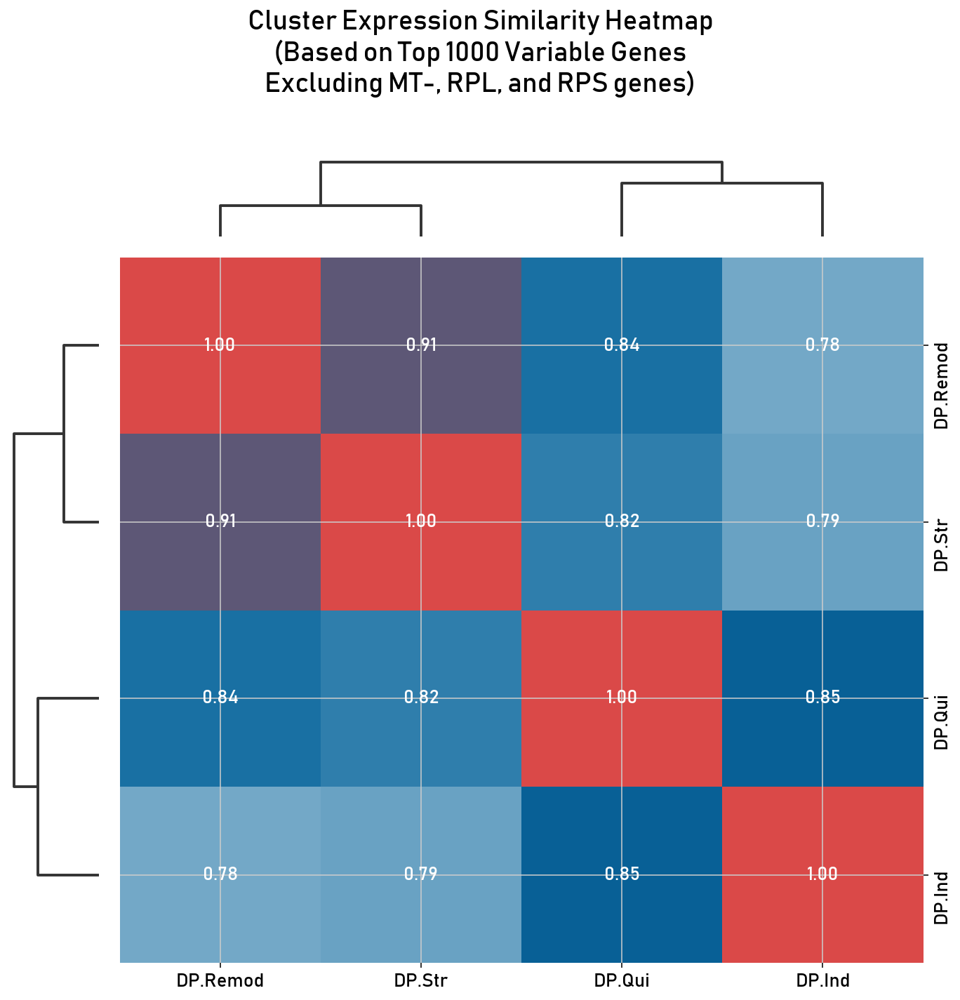

In [17]:
# GENE CHARACTERIZATION — SIMILARITY MATRIX
similarity_matrix, top_genes = calculate_gene_expression_similarity(
    adata_dp, clusters_to_keep, n_top_genes=500,
)

plot_expression_similarity_heatmap(similarity_matrix)
plt.savefig(os.path.join(output_dir, "DP_SimilarityMatrix.png"), bbox_inches="tight")

In [18]:
# GENE CHARACTERIZATION — CLUSTER MARKERS
gene_analysis = analyze_cluster_genes(
    adata_dp, clusters_to_keep, n_genes_display=200,
)

for result in gene_analysis:
    print(f"\nTop 5 genes for {result['cluster']}:")
    for gene, score, log2fc in zip(
        result["top_genes"][:5], result["scores"][:5], result["log2fc"][:5]
    ):
        print(f"  {gene}: score={score:.2f}, log2FC={log2fc:.2f}")


Top 5 genes for DP.Qui:
  CFD: score=13.04, log2FC=3.36
  CFH: score=12.15, log2FC=3.03
  APOD: score=10.88, log2FC=3.90
  ZFP36: score=10.29, log2FC=1.81
  CST3: score=9.54, log2FC=2.27

Top 5 genes for DP.Ind:
  PTGDS: score=12.68, log2FC=4.88
  CDON: score=9.07, log2FC=3.67
  SNED1: score=8.67, log2FC=2.37
  LSAMP: score=8.62, log2FC=3.13
  NFIA: score=7.89, log2FC=1.77

Top 5 genes for DP.Remod:
  HTRA1: score=9.88, log2FC=2.08
  HSPA5: score=9.72, log2FC=2.44
  POSTN: score=9.21, log2FC=2.16
  SOX4: score=9.09, log2FC=1.66
  PMEPA1: score=8.90, log2FC=1.66

Top 5 genes for DP.Str:
  COL11A1: score=12.40, log2FC=3.22
  THSD4: score=9.97, log2FC=2.55
  ITGBL1: score=9.01, log2FC=2.24
  TPM1: score=7.86, log2FC=1.77
  AOPEP: score=7.61, log2FC=1.32


In [19]:
# DENDROGRAM + RANK GENES
sc.tl.dendrogram(adata_dp, cor_method="spearman", groupby="fine_clust")
sc.tl.rank_genes_groups(adata_dp, groupby="fine_clust")

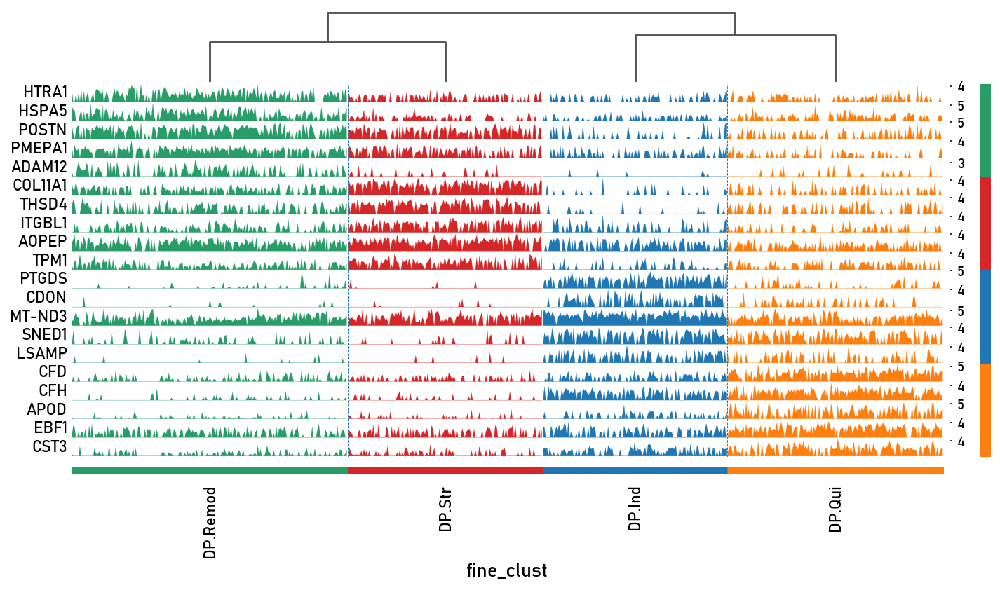

In [20]:
# TRACKSPLOT
with plt.rc_context({"figure.figsize": FIGSIZE_WIDE}):
    sc.pl.rank_genes_groups_tracksplot(
        adata_dp, show=False, min_logfoldchange=0.5, n_genes=5,
    )
    plt.savefig(os.path.join(output_dir, "Gene_Signatures_DP.png"), bbox_inches="tight")

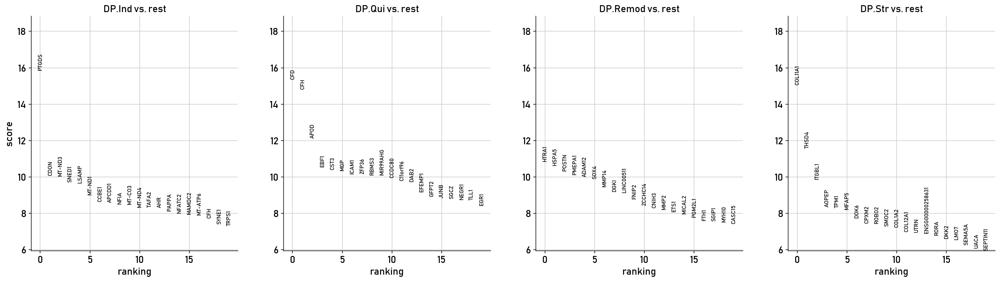

In [21]:
# DOTPLOT
sc.pl.rank_genes_groups(adata_dp, n_genes=20)

Plotting 40 genes


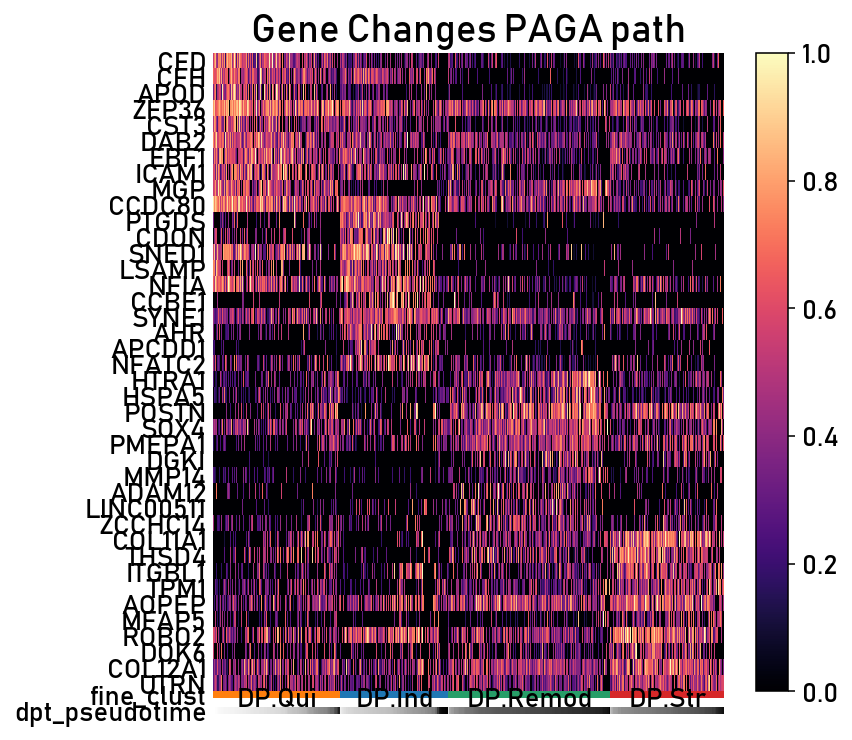

In [22]:
# PAGA PATH — CURATED GENES
n_per_cluster = 10
seen = set()
curated_genes = []
for cluster_data in gene_analysis:
    count = 0
    for gene in cluster_data["top_genes"]:
        if gene not in seen:
            curated_genes.append(gene)
            seen.add(gene)
            count += 1
        if count >= n_per_cluster:
            break

print(f"Plotting {len(curated_genes)} genes")

sc.pl.paga_path(
    adata_dp,
    nodes=clusters_to_keep,
    keys=curated_genes,
    groups_key="fine_clust",
    use_raw=True,
    normalize_to_zero_one=True,
    show_node_names=True,
    show_yticks=True,
    show_colorbar=True,
    color_map="magma",
    show=True,
    title="Gene Changes PAGA path",
    title_fontsize=20,
    save=True,
)

In [23]:
# SPARSE FORMAT CONVERSION
if scipy.sparse.issparse(adata_dp.X):
    adata_dp.X = adata_dp.X.tocsr()

for layer_name in adata_dp.layers:
    if scipy.sparse.issparse(adata_dp.layers[layer_name]):
        adata_dp.layers[layer_name] = adata_dp.layers[layer_name].tocsr()

In [24]:
# OPTIMAL TRANSPORT — MOSCOT
category_map = {"Anagen": 1, "Catagen": 2, "Telogen": 0}

adata_dp.obs["hair_cycle_numeric"] = (
    adata_dp.obs["orig.ident"].map(category_map).astype("float")
)

tp = TemporalProblem(adata_dp)
tp = tp.prepare(time_key="hair_cycle_numeric")
tp = tp.solve(epsilon=1e-3, tau_a=0.95, scale_cost="mean")

INFO     Computing pca with `n_comps=30` for `xy` using `adata.X`                                                  
INFO     Computing pca with `n_comps=30` for `xy` using `adata.X`                                                  
INFO     Solving `2` problems                                                                                      
INFO     Solving problem BirthDeathProblem[stage='prepared', shape=(142, 287)].                                    
INFO     Solving problem BirthDeathProblem[stage='prepared', shape=(287, 228)].                                    


In [25]:
# CELLRANK REAL-TIME KERNEL
sc.pp.neighbors(adata_dp, use_rep="X_pca", n_neighbors=30)

tmk = RealTimeKernel.from_moscot(tp, graph_key="X_pca")
tmk.compute_transition_matrix(
    self_transitions="all", conn_weight=0.2, threshold="auto",
)

  0%|          | 0/2 [00:00<?, ?time pair/s]

INFO     Using automatic `threshold=4.965714e-17`                                                                  


RealTimeKernel[n=657, threshold='auto', self_transitions='all']

INFO     Simulating 5000 random walks of maximum length 20                                                         


  0%|          | 0/5000 [00:00<?, ?sim/s]

INFO         Finish (8.22s)                                                                                        
INFO     Plotting random walks                                                                                     


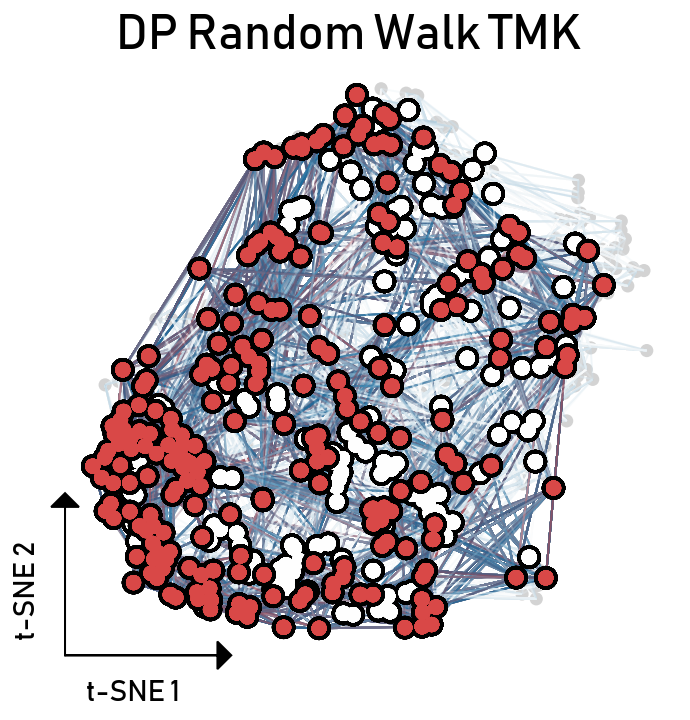

In [26]:
# RANDOM WALKS
ax = plot_random_walk_tsne(tmk, plot_title="DP Random Walk TMK")
plt.savefig(os.path.join(output_dir, "DP_Random_TMK.png"), bbox_inches="tight")

WARNING  Categories are not ordered. Using ascending order                                                         
INFO     Computing flow from `DP.Qui` into `3` cluster(s) in `2` time points                                       
INFO     Plotting flow from `DP.Qui` into `3` cluster(s) in `2` time points                                        


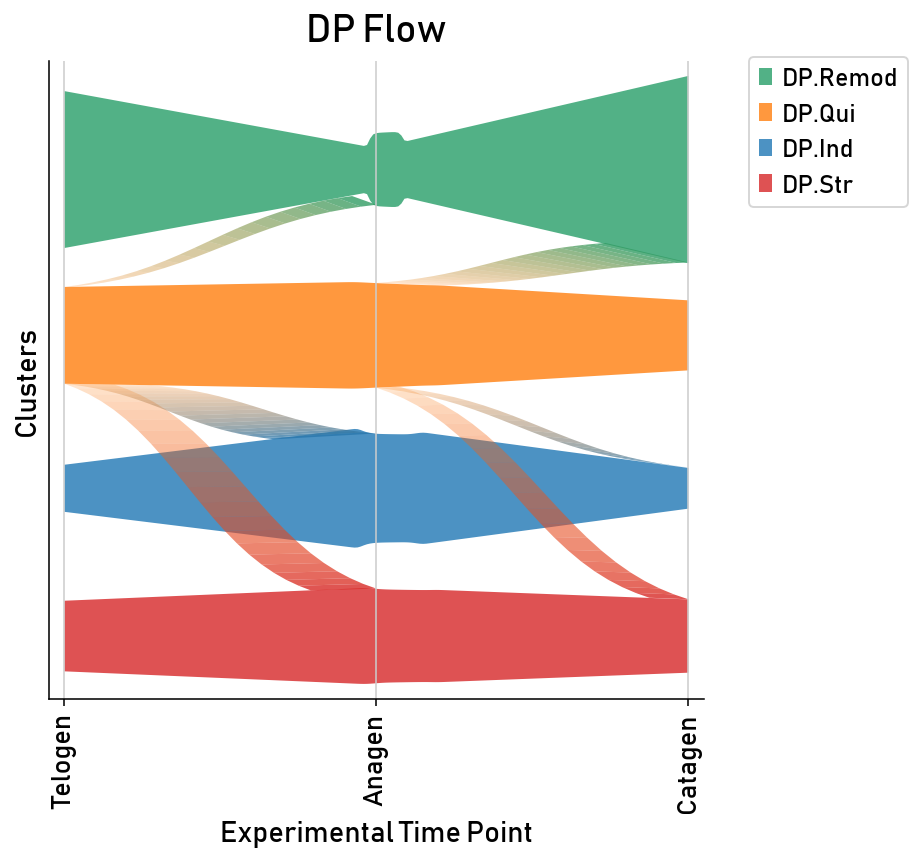

In [27]:
# SINGLE FLOW
ax = tmk.plot_single_flow(
    cluster_key="fine_clust",
    time_key="hair_cycle_numeric",
    cluster="DP.Qui",
    xticks_step_size=1,
    show=False,
    clusters=clusters_to_keep,
)
ax.set_title("DP Flow", fontsize=20, pad=10)
ax.set_xlabel("Experimental Time Point", fontsize=15)
ax.set_ylabel("Clusters", fontsize=15)
ax.set_xticklabels(["Telogen", "Anagen", "Catagen"], rotation=90)
plt.savefig(os.path.join(output_dir, "DPFlow.png"), bbox_inches="tight")

In [28]:
# MAGIC IMPUTATION
imputed_X = palantir.utils.run_magic_imputation(adata_dp)

In [55]:
# GPCCA ESTIMATOR — FIT MACROSTATES
g = cr.estimators.GPCCA(tmk)
g.compute_schur()
g.compute_macrostates(cluster_key="fine_clust", n_states=[5,10])

INFO     Computing Schur decomposition                                                                             
INFO     Adding `adata.uns['eigendecomposition_fwd']`                                                              
                `.schur_vectors`                                                                                   
                `.schur_matrix`                                                                                    
                `.eigendecomposition`                                                                              
             Finish (0.02s)                                                                                        
INFO     Calculating minChi criterion in interval `[5, 10]`                                                        
INFO     Computing 6 macrostates                                                                                   
INFO     Adding `.macrostates`                                          

GPCCA[kernel=RealTimeKernel[n=657], initial_states=None, terminal_states=None]

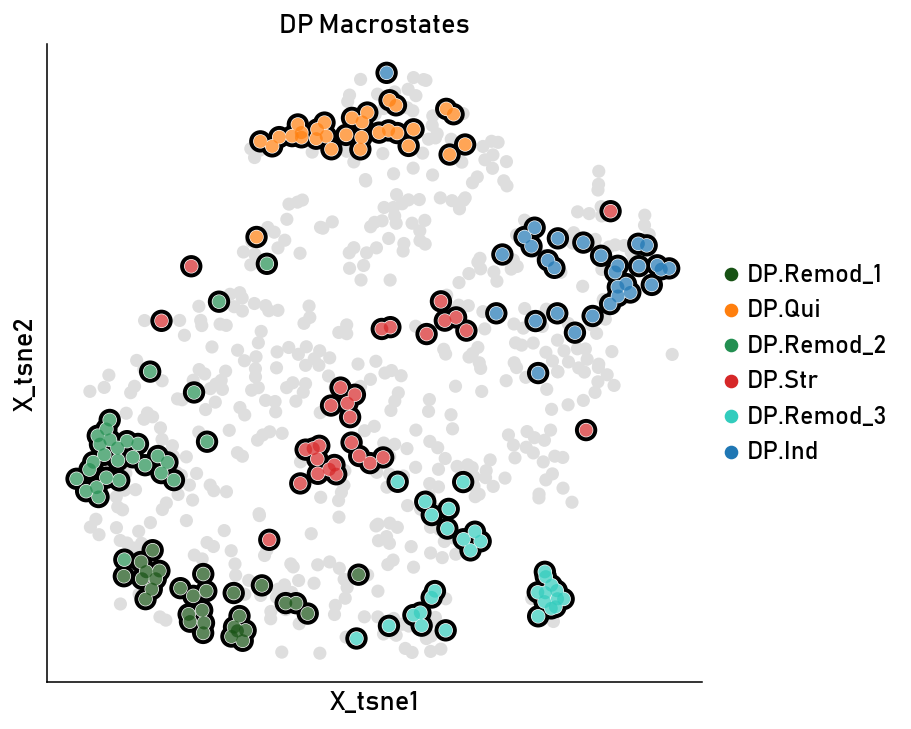

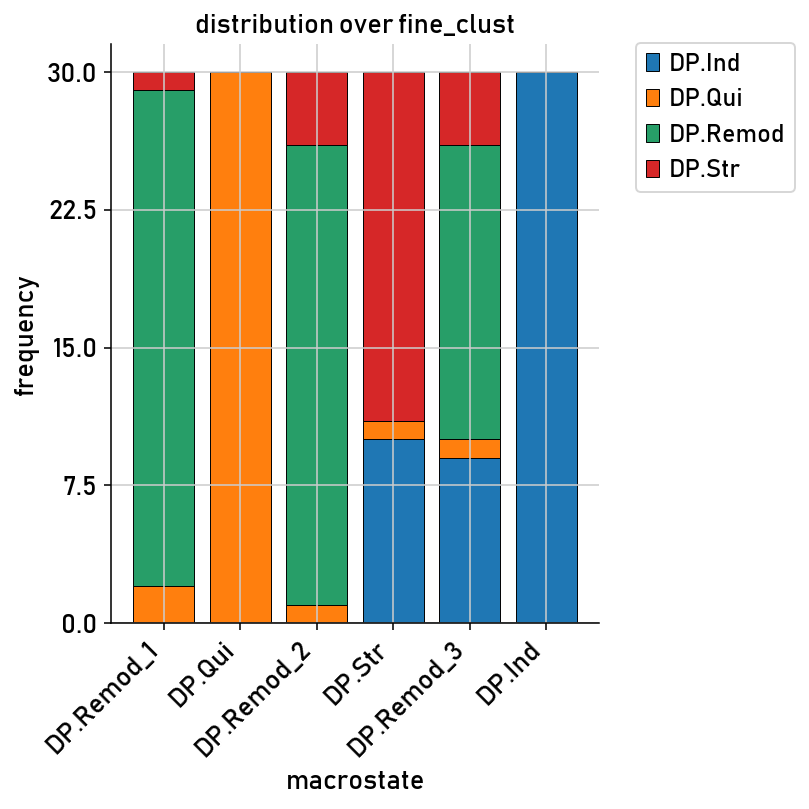

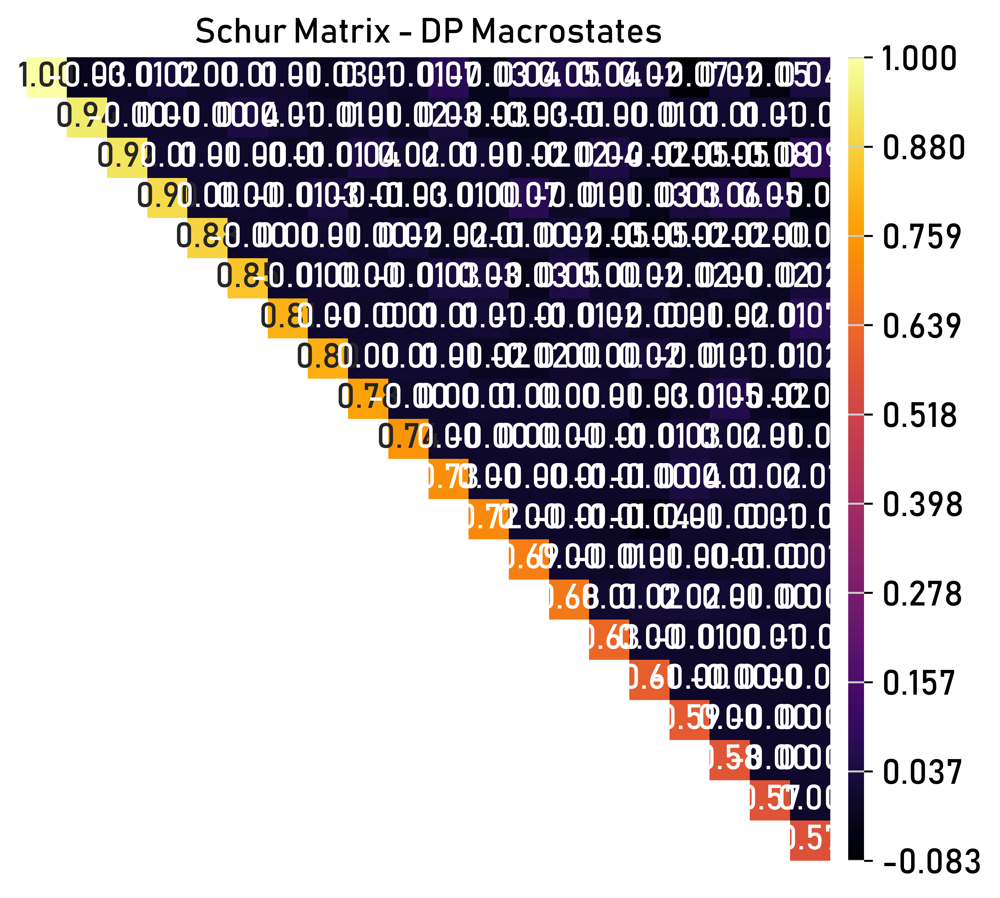

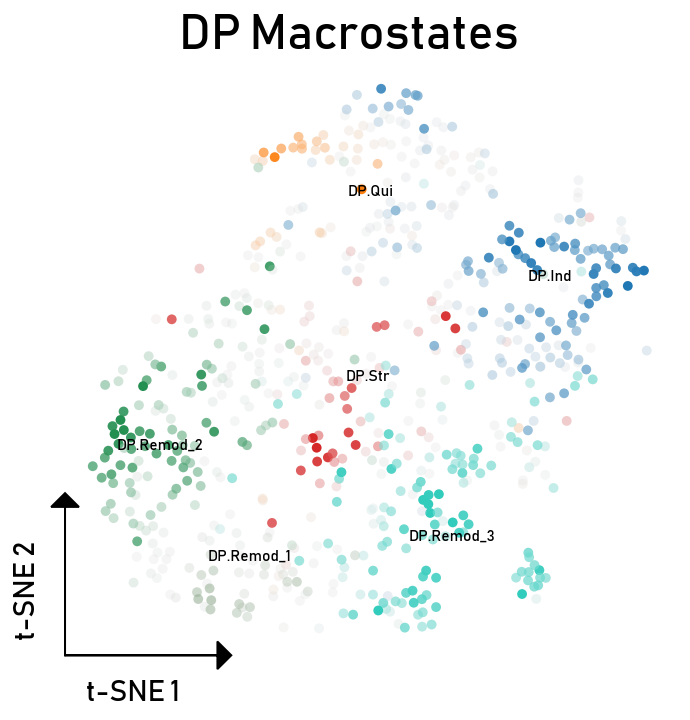

In [56]:
# MACROSTATE VISUALIZATIONS
g.plot_macrostates(
    which="all", basis="X_tsne", legend_loc="right",
    title="DP Macrostates",
    save=os.path.join(output_dir, "DP_macrostates_tsne.png"),
)

g.plot_macrostate_composition(
    key="fine_clust",
    save=os.path.join(output_dir, "DP_macrostate_composition.png"),
)

g.plot_schur_matrix(
    title="Schur Matrix - DP Macrostates",
    cmap="inferno", figsize=FIGSIZE_SINGLE, dpi=300,
    save=os.path.join(output_dir, "DP_schur_matrix.png"),
)

ax = plot_macrostates_tsne(adata_dp, g, plot_title="DP Macrostates")
plt.savefig(os.path.join(output_dir, "DP_macrostates_tsne_custom.png"), bbox_inches="tight")

In [32]:
# HVGs + FATE PROBABILITIES
sc.pp.highly_variable_genes(adata_dp, n_top_genes=1000, flavor="seurat")

g.set_initial_states(states=["DP.Qui"])
g.set_terminal_states(states=["DP.Ind", "DP.Remod_3"])
g.compute_fate_probabilities()
g.compute_eigendecomposition()

INFO     Adding `adata.obs['init_states_fwd']`                                                                     
                `adata.obs['init_states_fwd_probs']`                                                               
                `.initial_states`                                                                                  
                `.initial_states_probabilities`                                                                    
                `.initial_states_memberships                                                                       
             Finish`                                                                                               
INFO     Adding `adata.obs['term_states_fwd']`                                                                     
                `adata.obs['term_states_fwd_probs']`                                                               
                `.terminal_states`                                      

  0%|          | 0/2 [00:00<?, ?/s]

INFO     Adding `adata.obsm['lineages_fwd']`                                                                       
                `.fate_probabilities`                                                                              
             Finish (0.07s)                                                                                        
INFO     Computing eigendecomposition of the transition matrix                                                     
INFO     Adding `adata.uns['eigendecomposition_fwd']`                                                              
                `.eigendecomposition`                                                                              
             Finish (0.05s)                                                                                        


GPCCA[kernel=RealTimeKernel[n=657], initial_states=[np.str_('DP.Qui')], terminal_states=[np.str_('DP.Ind'), np.str_('DP.Remod_3')]]

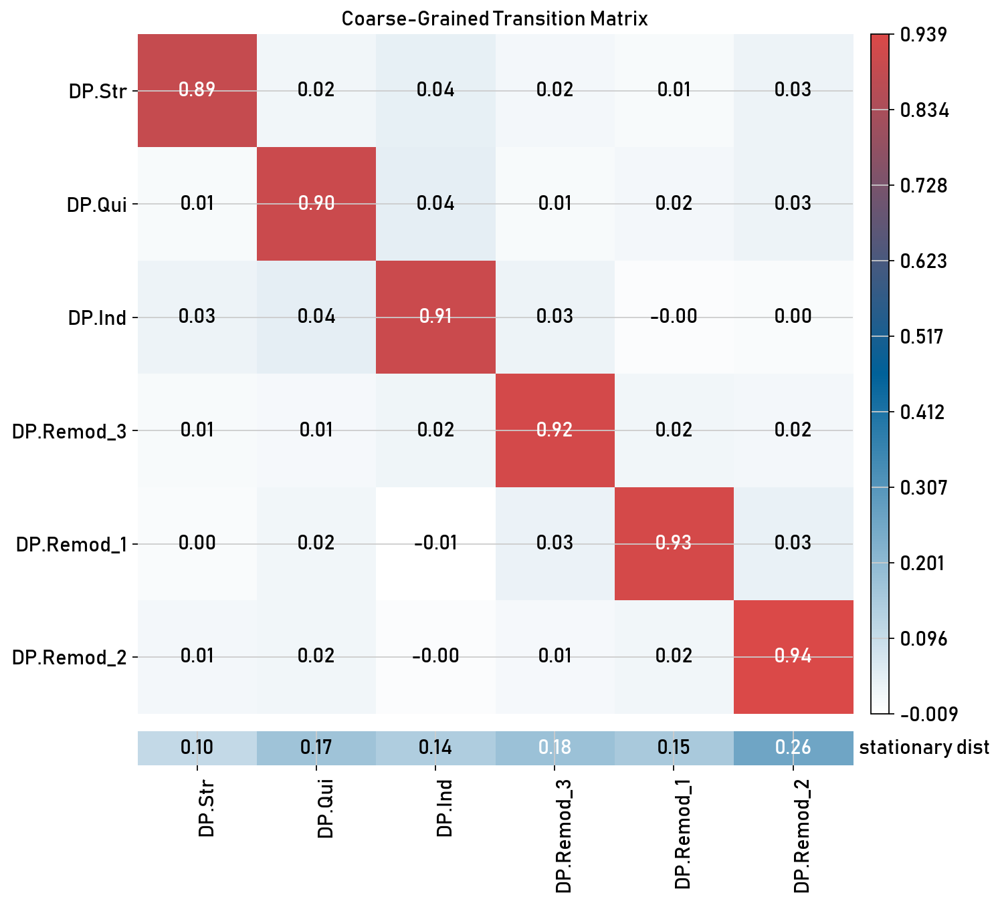

In [33]:
# COARSE-GRAINED TRANSITION MATRIX
g.plot_coarse_T(
    title="Coarse-Grained Transition Matrix",
    figsize=(9, 9), xtick_rotation=90, cmap="custom_wbr",
    save=os.path.join(output_dir, "DP_CoarseTMatrix.png"),
)

In [34]:
# DRIVER GENES PER MACROSTATE — DE ON MAGIC-IMPUTED DATA
macrostate_names = adata_dp.obs["macrostates_fwd"].cat.categories.tolist()
print("Macrostates:", macrostate_names)

sc.tl.rank_genes_groups(
    adata_dp, groupby="macrostates_fwd",
    method="wilcoxon", layer="MAGIC_imputed_data",
)

n_top = 50
macrostate_drivers = {}

for state in macrostate_names:
    df = sc.get.rank_genes_groups_df(adata_dp, group=state)
    df_sig = df[(df["pvals_adj"] < 0.05) & (df["logfoldchanges"] > 0.5)]
    macrostate_drivers[state] = df_sig.head(n_top)["names"].tolist()
    print(f"\n{state} top {min(n_top, len(df_sig))} drivers:")
    print(f"  {macrostate_drivers[state][:10]}")

for state, genes in macrostate_drivers.items():
    df = sc.get.rank_genes_groups_df(adata_dp, group=state)
    safe_name = state.replace(".", "_").replace(" ", "_")
    df.to_csv(os.path.join(output_dir, f"drivers_{safe_name}.csv"), index=False)

Macrostates: ['DP.Remod_1', 'DP.Qui', 'DP.Remod_2', 'DP.Str', 'DP.Remod_3', 'DP.Ind']

DP.Remod_1 top 50 drivers:
  ['DNAAF2', 'NECAP2', 'ENSG00000266049', 'VAT1', 'GTF2A1', 'GID8', 'SLC3A2', 'MOB1A', 'NIFK', 'EXOSC1']

DP.Qui top 50 drivers:
  ['STRAP', 'ENSG00000289040', 'FGF7', 'OAF', 'NOL10', 'CD40', 'HIC1', 'MYLIP', 'SGMS2', 'IFI16']

DP.Remod_2 top 50 drivers:
  ['UBE2E2', 'PARD3', 'GNAQ', 'DIP2C', 'HTT', 'SRPK2', 'PSD3', 'TCF7L2', 'AKAP13', 'BCR']

DP.Str top 50 drivers:
  ['C9orf85', 'UBFD1', 'ENSG00000287811', 'GSTCD', 'DHX35', 'ENSG00000288778', 'ZNF862', 'LRRC69', 'TXNRD3', 'SLC35B3']

DP.Remod_3 top 50 drivers:
  ['FBXW9', 'MUSTN1', 'LSR', 'RBM47', 'BARX2', 'PGAP2', 'DPP6', 'TRIM29', 'LGALS7B', 'GPT2']

DP.Ind top 50 drivers:
  ['AGBL4', 'CBFA2T3', 'SDK1', 'ADH4', 'TENM2', 'SLFN12L', 'LINC00937', 'DLG5', 'LCNL1', 'ZNF385D']


In [35]:
# DEFINE BOTH LINEAGES
remod_order = {
    "DP.Qui": 1,
    "DP.Remod_2": 2,
    "DP.Remod_1": 3,
    "DP.Remod_3": 4,
}

activity_order = {
    "DP.Qui": 1,
    "DP.Ind": 2,
}

print("Available macrostates:", adata_dp.obs["macrostates"].cat.categories.tolist())
print("Terminal states:", g.terminal_states.cat.categories.tolist())
print("macrostate_drivers keys:", list(macrostate_drivers.keys()))

Available macrostates: ['DP.Remod_1', 'DP.Qui', 'DP.Remod_2', 'DP.Str', 'DP.Remod_3', 'DP.Ind']
Terminal states: [np.str_('DP.Ind'), np.str_('DP.Remod_3')]
macrostate_drivers keys: ['DP.Remod_1', 'DP.Qui', 'DP.Remod_2', 'DP.Str', 'DP.Remod_3', 'DP.Ind']


In [36]:
# COMPUTE SEPARATE PSEUDOTIMES
adata_dp = create_custom_trajectory(
    adata_dp, remod_order,
    cluster_col="macrostates", basis="X_tsne",
)
adata_dp.obs["pseudotime_remod"] = adata_dp.obs["custom_pseudotime"].copy()

activity_states = list(activity_order.keys())
activity_mask = adata_dp.obs["macrostates"].isin(activity_states)

adata_activity = adata_dp[activity_mask].copy()
adata_activity = create_custom_trajectory(
    adata_activity, activity_order,
    cluster_col="macrostates", basis="X_tsne",
)

adata_dp.obs["pseudotime_activity"] = np.nan
adata_dp.obs.loc[activity_mask, "pseudotime_activity"] = adata_activity.obs["custom_pseudotime"].values

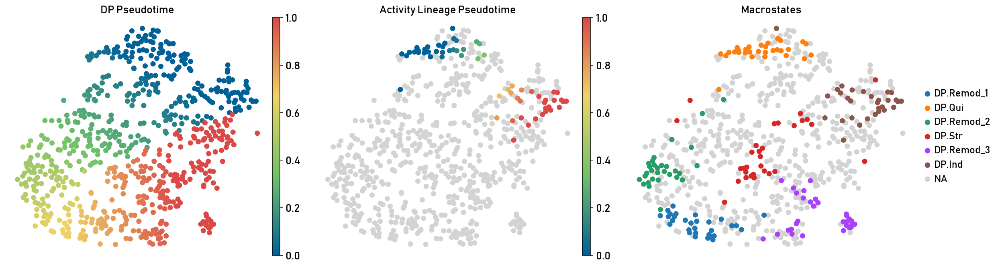

In [37]:
# SIDE-BY-SIDE PSEUDOTIME EMBEDDINGS
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

sc.pl.embedding(
    adata_dp, basis="X_tsne", color="pseudotime_remod",
    ax=axes[0], show=False, cmap="custom_btry", frameon=False,
    title="DP Pseudotime",
)

sc.pl.embedding(
    adata_dp, basis="X_tsne", color="pseudotime_activity",
    ax=axes[1], show=False, cmap="custom_btry", frameon=False,
    title="Activity Lineage Pseudotime",
    na_color="lightgray",
)

sc.pl.embedding(
    adata_dp, basis="X_tsne", color="macrostates",
    ax=axes[2], show=False, frameon=False,
    title="Macrostates",
)

plt.tight_layout()
plt.savefig(os.path.join(output_dir, "dp_dual_pseudotime.png"),
            dpi=300, bbox_inches="tight")
plt.show()

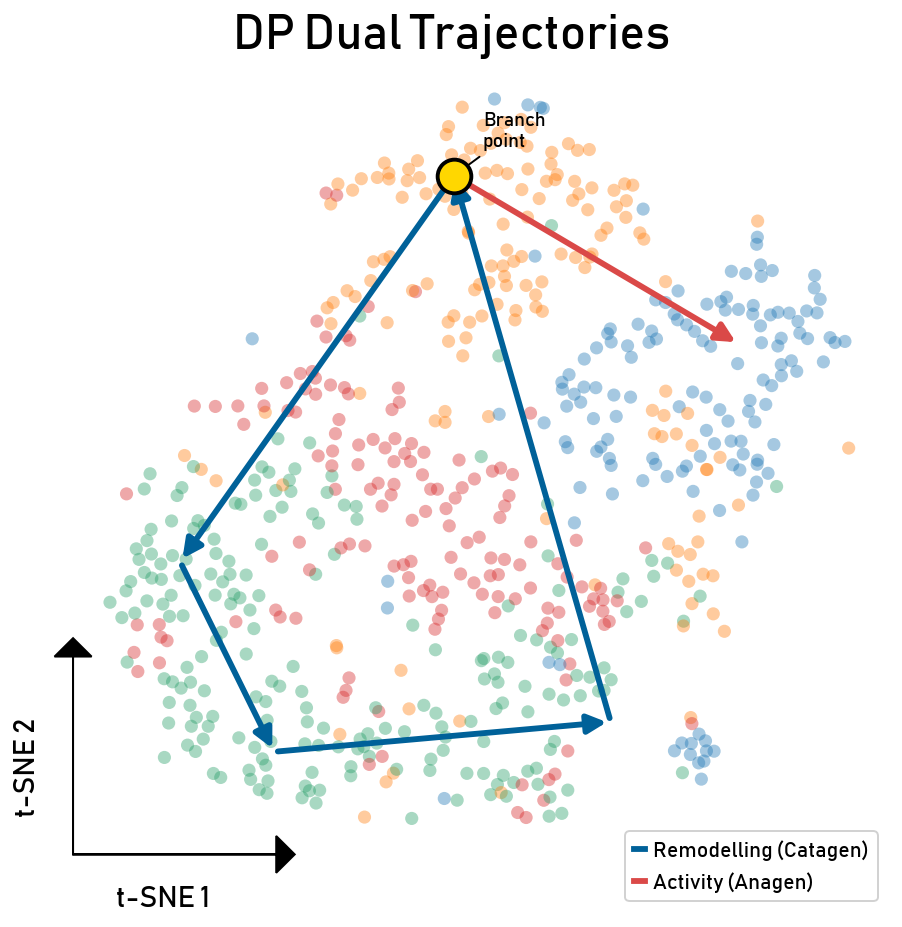

In [38]:
# COMBINED TRAJECTORY ARROWS ON TSNE
fig, ax = plt.subplots(figsize=(8, 8))

sc.pl.embedding(
    adata_dp, basis="X_tsne", color="fine_clust",
    ax=ax, show=False, frameon=False, alpha=0.4,
    title="DP Dual Trajectories",
)

centroids = {}
for state in adata_dp.obs["macrostates"].cat.categories:
    mask = adata_dp.obs["macrostates"] == state
    if mask.any():
        centroids[state] = adata_dp[mask].obsm["X_tsne"].mean(axis=0)

remod_states = [k for k, v in sorted(remod_order.items(), key=lambda x: x[1])]
for i in range(len(remod_states)):
    start = centroids[remod_states[i]]
    end = centroids[remod_states[(i + 1) % len(remod_states)]]
    ax.annotate(
        "", xy=(end[0], end[1]), xytext=(start[0], start[1]),
        arrowprops=dict(arrowstyle="-|>", color="#006199", lw=3, mutation_scale=20),
    )

activity_states_sorted = [k for k, v in sorted(activity_order.items(), key=lambda x: x[1])]
for i in range(len(activity_states_sorted) - 1):
    start = centroids[activity_states_sorted[i]]
    end = centroids[activity_states_sorted[i + 1]]
    ax.annotate(
        "", xy=(end[0], end[1]), xytext=(start[0], start[1]),
        arrowprops=dict(arrowstyle="-|>", color="#DA4948", lw=3, mutation_scale=20),
    )

legend_elements = [
    Line2D([0], [0], color="#006199", lw=3, label="Remodelling (Catagen)"),
    Line2D([0], [0], color="#DA4948", lw=3, label="Activity (Anagen)"),
]
ax.legend(handles=legend_elements, loc="lower right", fontsize=11, framealpha=0.9)

branch = centroids[activity_states_sorted[0]]
ax.scatter(branch[0], branch[1], s=300, c="gold", edgecolors="black",
           linewidths=2, zorder=10)
ax.annotate(
    "Branch\npoint", xy=(branch[0], branch[1]),
    xytext=(15, 15), textcoords="offset points",
    fontsize=10, fontweight="bold",
    arrowprops=dict(arrowstyle="->", color="black", lw=1),
)

_style_embedding_ax(ax, "DP Dual Trajectories")
plt.savefig(os.path.join(output_dir, "DP_dual_trajectory_arrows.png"),
            dpi=300, bbox_inches="tight")
plt.show()

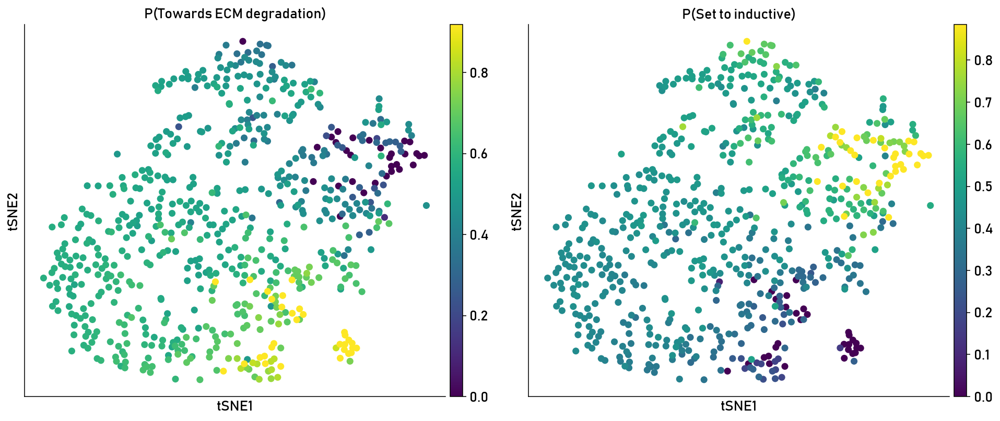

In [42]:
# FATE PROBABILITY COMPARISON
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

g.plot_fate_probabilities(
    same_plot=False, basis="tsne",
    states=["DP.Remod_3"],
    ax=axes[0], show=False,
)
axes[0].set_title("P(Towards ECM degradation)", fontsize=14)

g.plot_fate_probabilities(
    same_plot=False, basis="tsne",
    states=["DP.Ind"],
    ax=axes[1], show=False,
)
axes[1].set_title("P(Set to inductive)", fontsize=14)

plt.tight_layout()
plt.savefig(os.path.join(output_dir, "DP_fate_probabilities.png"),
            dpi=300, bbox_inches="tight")
plt.show()

In [43]:
# ESCAPE SUBSET + GAMR MODELS
adata_activity_subset = adata_dp[adata_dp.obs["pseudotime_activity"].notna()].copy()

model_remod = cr.models.GAMR(adata_dp, n_knots=8, smoothing_penalty=6)
model_activity = cr.models.GAMR(adata_activity_subset, n_knots=8, smoothing_penalty=6)

In [44]:
# COLLECT DRIVER GENES FROM BOTH TRAJECTORIES
combined_genes = []
for state in list(remod_order.keys()) + list(activity_order.keys()):
    if state in macrostate_drivers:
        combined_genes.extend(macrostate_drivers[state][:5])
combined_genes = list(dict.fromkeys(combined_genes))
print(f"Genes for dual trend plot: {len(combined_genes)}")

Genes for dual trend plot: 25


INFO     Computing trends using 1 core(s)                                                                          


  0%|          | 0/15 [00:00<?, ?gene/s]

INFO         Finish (0.46s)                                                                                        
INFO     Plotting trends                                                                                           


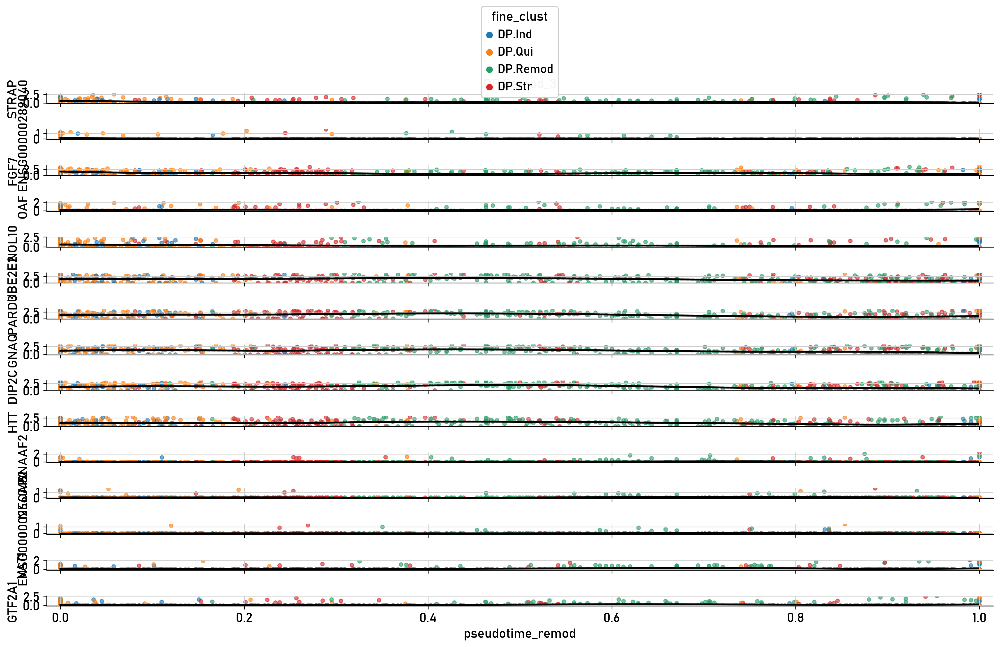

In [45]:
# CYCLIC LINEAGE TRENDS
cr.pl.gene_trends(
    adata_dp, model=model_remod,
    genes=combined_genes[:15],
    lineages="DP.Remod_3",
    time_key="pseudotime_remod",
    same_plot=False,
    hide_cells=False,
    cell_color="fine_clust",
    figsize=(15, 10), ncols=4, dpi=150,
    save=os.path.join(output_dir, "gene_trends_remod.png"),
)

INFO     Computing trends using 1 core(s)                                                                          


  0%|          | 0/15 [00:00<?, ?gene/s]

INFO         Finish (0.42s)                                                                                        
INFO     Plotting trends                                                                                           


/home/uvictor/miniconda3/envs/ubels26_haircycle/lib/python3.12/site-packages/cellrank/_utils/_utils.py:837: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  fig.savefig(path, bbox_inches="tight", transparent=True)
/home/uvictor/miniconda3/envs/ubels26_haircycle/lib/python3.12/site-packages/IPython/core/events.py:96: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  func(*args, **kwargs)
/home/uvictor/miniconda3/envs/ubels26_haircycle/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


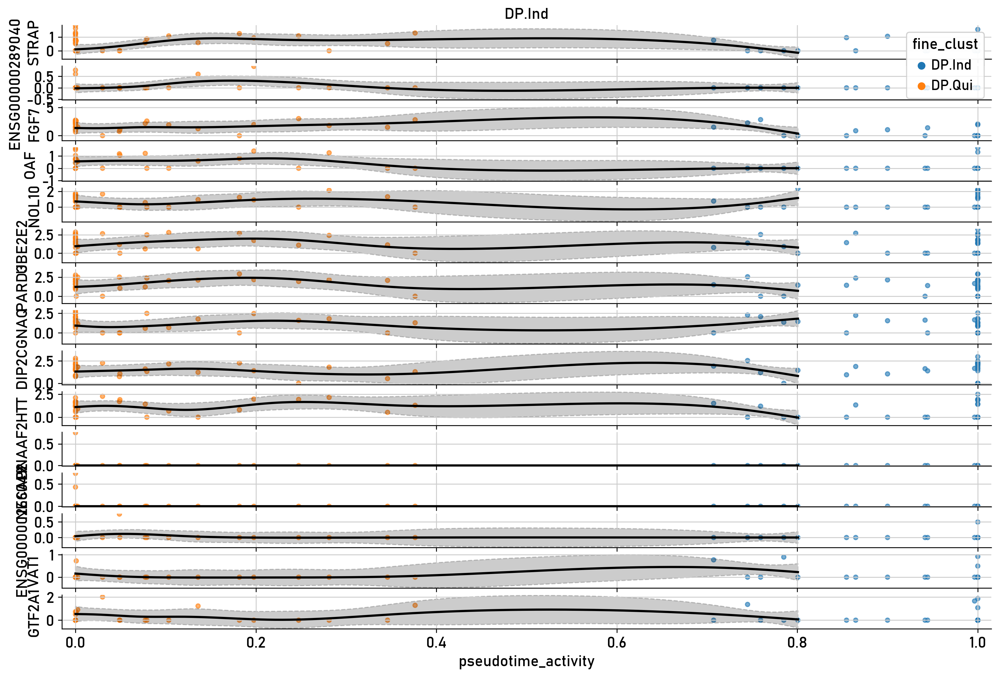

In [46]:
# ACTIVITY LINEAGE TRENDS
cr.pl.gene_trends(
    adata_activity_subset, model=model_activity,
    genes=combined_genes[:15],
    lineages="DP.Ind",
    time_key="pseudotime_activity",
    same_plot=False,
    hide_cells=False,
    cell_color="fine_clust",
    figsize=(15, 10), ncols=4, dpi=150,
    save=os.path.join(output_dir, "gene_trends_activity.png"),
)

In [47]:
# HEATMAP GENE LIST
heatmap_genes_combined = []
for state in list(remod_order.keys()) + list(activity_order.keys()):
    if state in macrostate_drivers:
        heatmap_genes_combined.extend(macrostate_drivers[state][:20])
heatmap_genes_combined = list(dict.fromkeys(heatmap_genes_combined))
print(f"Heatmap gene count: {len(heatmap_genes_combined)}")

Heatmap gene count: 100


INFO     Computing trends using 1 core(s)                                                                          


  0%|          | 0/100 [00:00<?, ?gene/s]

INFO         Finish (1.97s)                                                                                        


[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.


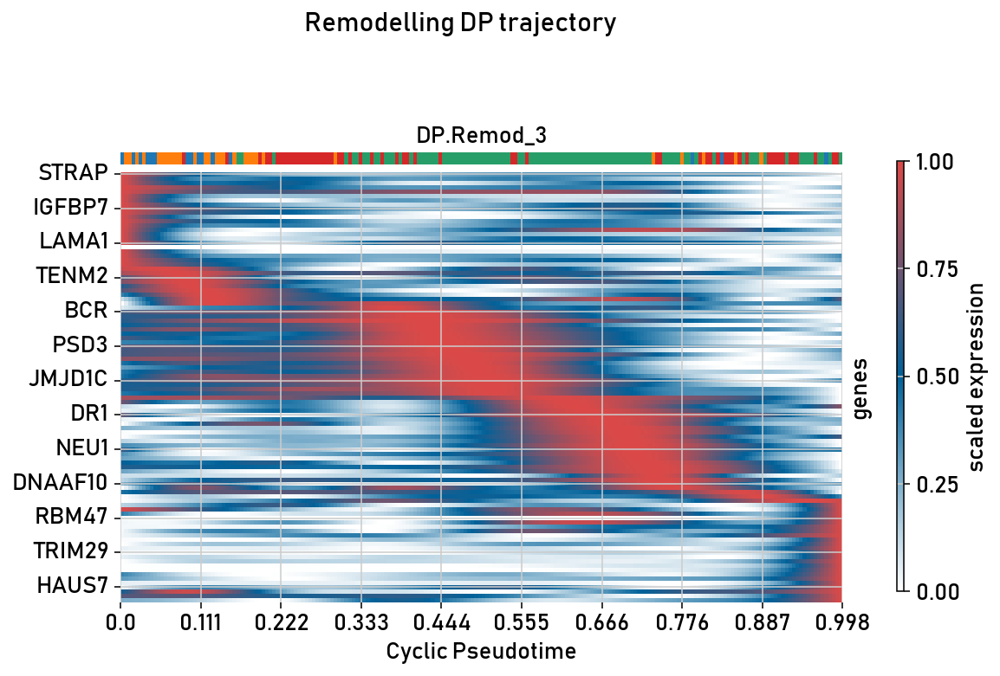

In [48]:
# CYCLIC HEATMAP
result_cyclic = cr.pl.heatmap(
    adata_dp, model=model_remod,
    lineages="DP.Remod_3",
    cluster_key="fine_clust",
    genes=heatmap_genes_combined,
    time_key="pseudotime_remod",
    xlabel="Cyclic Pseudotime",
    figsize=(9, 5),
    show_all_genes=False,
    return_figure=True,
    cmap="custom_wbr",
)

cg_cyclic = result_cyclic[0][0]
cg_cyclic.fig.suptitle("Remodelling DP trajectory", fontsize=16, y=1.02)
cg_cyclic.fig.savefig(
    os.path.join(output_dir, "heatmap_remod.png"),
    dpi=300, bbox_inches="tight",
)

INFO     Computing trends using 1 core(s)                                                                          


  0%|          | 0/100 [00:00<?, ?gene/s]

INFO         Finish (1.57s)                                                                                        


[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
--------------------------------------------------------------------------
MPI_ABORT was invoked on rank 0 in communicator MPI_COMM_WORLD
  Proc: [[28607,0],0]
  Errorcode: 59

NOTE: invoking MPI_ABORT causes Open MPI to kill all MPI processes.
You may or may not see output from other processes, depending on
exactly when Open MPI kills them.
--------------------------------------------------------------------------


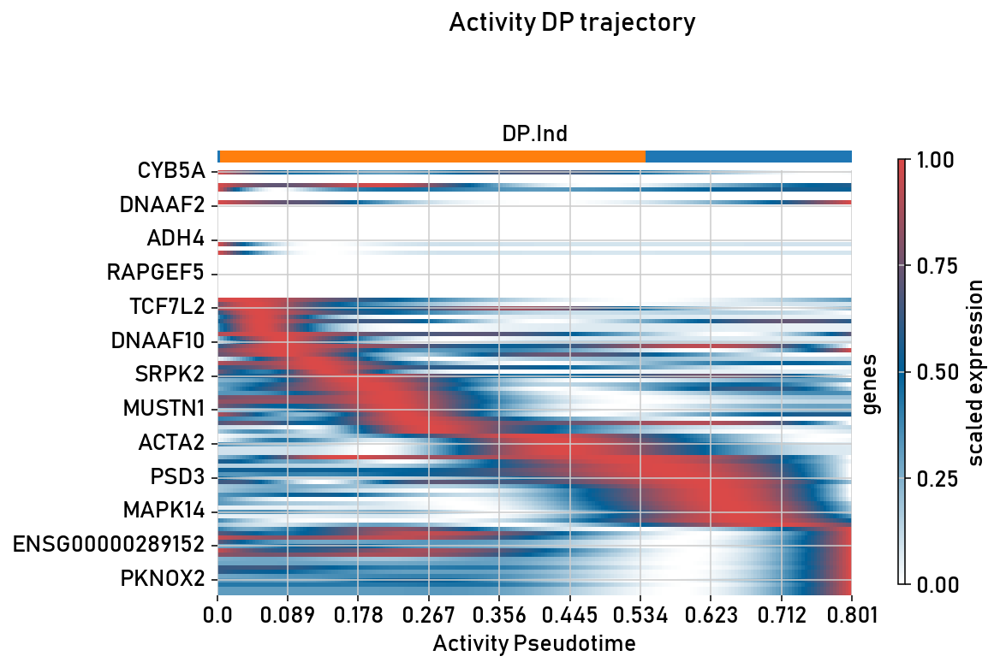

In [49]:
# ACTIVITY HEATMAP
result_activity = cr.pl.heatmap(
    adata_activity_subset, model=model_activity,
    lineages="DP.Ind",
    cluster_key="fine_clust",
    genes=heatmap_genes_combined,
    time_key="pseudotime_activity",
    xlabel="Activity Pseudotime",
    figsize=(9, 5),
    show_all_genes=False,
    return_figure=True,
    cmap="custom_wbr",
)

cg_activity = result_activity[0][0]
cg_activity.fig.suptitle("Activity DP trajectory", fontsize=16, y=1.02)
cg_activity.fig.savefig(
    os.path.join(output_dir, "heatmap_activity.png"),
    dpi=300, bbox_inches="tight",
)
plt.show()

In [57]:
# LINEAGE DRIVERS — HVG FILTERED
dp_drivers_df = g.compute_lineage_drivers(
    cluster_key="fine_clust",
    return_drivers=True,
    use_raw=False,
)

hvg_names = adata_dp.var_names[adata_dp.var["highly_variable"]]
dp_drivers_df = dp_drivers_df.loc[dp_drivers_df.index.isin(hvg_names)]

dp_drivers = dp_drivers_df.max(axis=1).sort_values(ascending=False)
dp_drivers.name = "max_driver_score"
print(f"Total lineage driver genes scored: {len(dp_drivers)}")
print(dp_drivers.head(20))

RuntimeError: Compute `.fate_probabilities` first as `.compute_fate_probabilities()`.

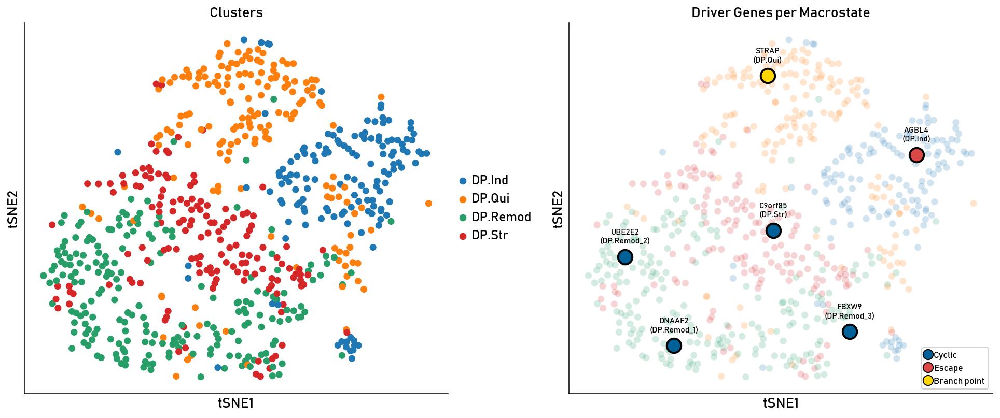

In [58]:
# DRIVER GENE EMBEDDING OVERLAY — DUAL TRAJECTORY
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sc.pl.embedding(
    adata_dp, basis="tsne", color="fine_clust",
    ax=axes[0], title="Clusters", show=False,
)
sc.pl.embedding(
    adata_dp, basis="tsne", color="fine_clust",
    ax=axes[1], title="Driver Genes per Macrostate",
    show=False, alpha=0.2,
)

cyclic_set = set(remod_order.keys())
escape_set = set(activity_order.keys())

for i, state in enumerate(macrostate_names):
    mask = adata_dp.obs["macrostates_fwd"] == state
    if not mask.any():
        continue

    centroid = adata_dp[mask].obsm["X_tsne"].mean(axis=0)
    top_gene = macrostate_drivers[state][0] if macrostate_drivers[state] else "N/A"

    if state in cyclic_set and state in escape_set:
        color = "gold"
    elif state in escape_set:
        color = "#DA4948"
    else:
        color = "#006199"

    axes[1].scatter(
        centroid[0], centroid[1],
        s=200, c=color, edgecolors="black", linewidths=2, zorder=5,
    )
    axes[1].annotate(
        f"{top_gene}\n({state})",
        xy=(centroid[0], centroid[1]),
        fontsize=8, fontweight="bold",
        ha="center", va="bottom",
        xytext=(0, 12), textcoords="offset points",
    )

axes[1].legend(
    handles=[
        Line2D([0], [0], marker="o", color="w", markerfacecolor="#006199",
               markersize=10, markeredgecolor="black", label="Cyclic"),
        Line2D([0], [0], marker="o", color="w", markerfacecolor="#DA4948",
               markersize=10, markeredgecolor="black", label="Escape"),
        Line2D([0], [0], marker="o", color="w", markerfacecolor="gold",
               markersize=10, markeredgecolor="black", label="Branch point"),
    ],
    loc="lower right", fontsize=9, framealpha=0.9,
)

plt.tight_layout()
plt.savefig(os.path.join(output_dir, "driver_genes_embedding.png"),
            dpi=300, bbox_inches="tight")
plt.show()

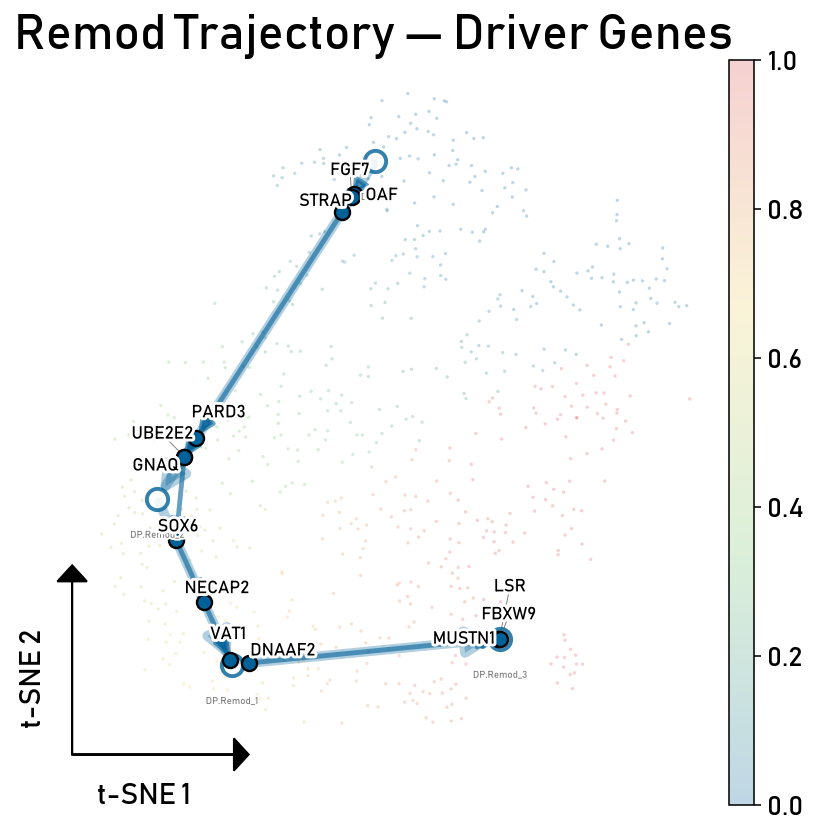

0 [ 0.0212821124 -0.4727423427]
1 [-0.3789768999  0.2537068754]
2 [ 0.1148996211 -0.3628408808]
3 [-0.2103135583 -0.4840508283]
4 [ 0.1644822466 -0.6767425791]
6 [0.1962676395 0.6516471545]
7 [-0.687216563   0.4686010386]
8 [-0.1827131358  0.5573758087]
9 [0.6079411352 0.5721428871]


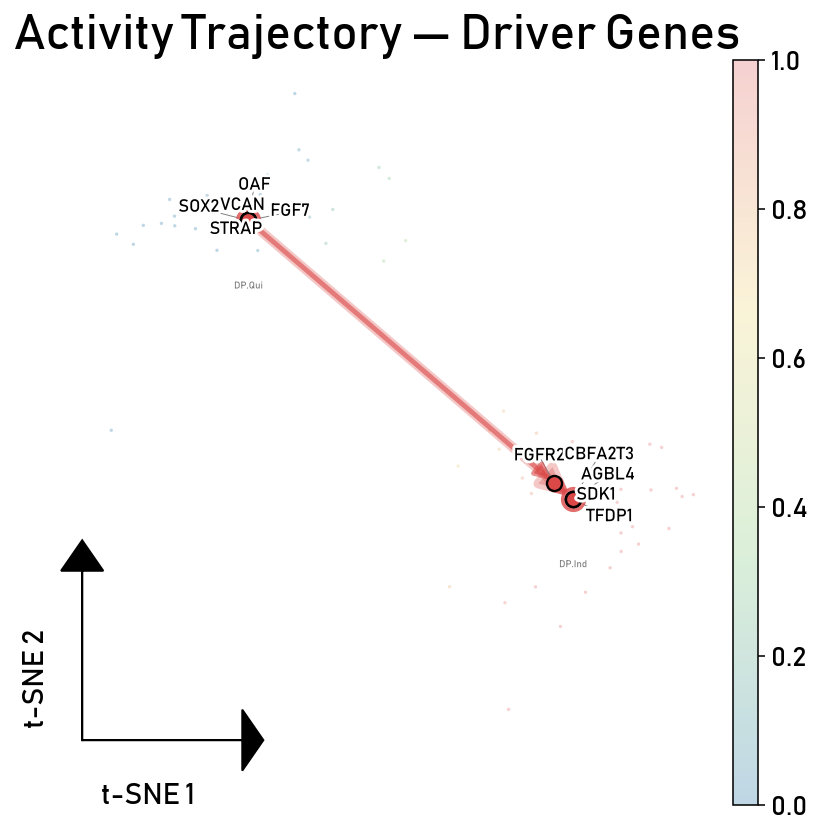

0 [0.1845740373 0.3289784057]
1 [ 0.2931345736 -0.1487270421]
2 [0.0271366675 0.0025156874]
3 [-0.9258323782  0.4162321904]
4 [0.2408612004 0.5556170692]
6 [-0.0811810687 -0.2403888906]
7 [-0.4162155929  0.114457725 ]
8 [-0.8316727966  0.2625633383]
9 [0.8891409758 0.7824750699]


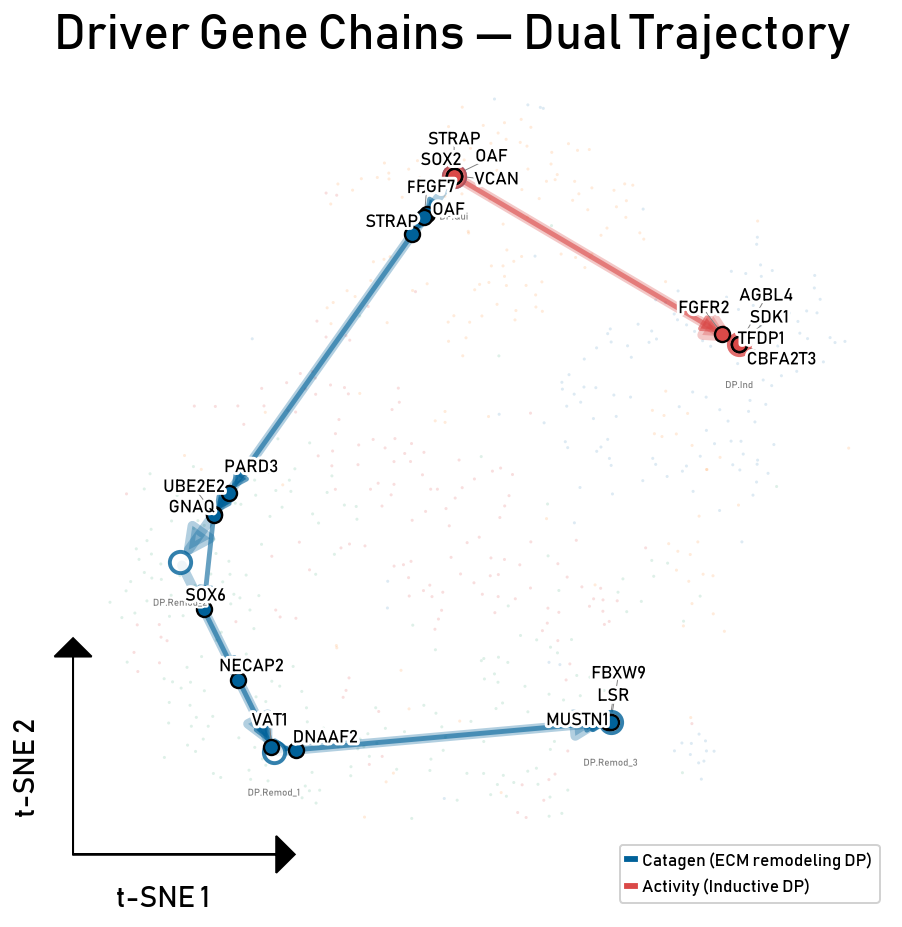

In [59]:
remod_custom_genes = [
    "SOX6",
]

activity_custom_genes = [
    "SOX2", "TFDP1", "VCAN", "FGFR2",
]

# %%
# REMOD
fig, ax = plt.subplots(figsize=(7, 7))

sc.pl.embedding(
    adata_dp, basis="X_tsne", color="pseudotime_remod",
    ax=ax, show=False, cmap="custom_btry", frameon=False,
    title="", alpha=0.25, size=12,
)

plot_linear_gene_chain(
    adata_dp, macrostate_drivers, remod_order,
    trajectory_color="#006199", ax=ax,
    pseudotime_key="pseudotime_remod",
    custom_genes=remod_custom_genes,
    n_genes_per_state=3,
)

_style_embedding_ax(ax, "Remod Trajectory — Driver Genes")
plt.savefig(os.path.join(output_dir, "gene_chain_remod.png"),
            dpi=300, bbox_inches="tight")
plt.show()

# %%
# ACTIVITY
fig, ax = plt.subplots(figsize=(7, 7))

sc.pl.embedding(
    adata_activity_subset, basis="X_tsne", color="pseudotime_activity",
    ax=ax, show=False, cmap="custom_btry", frameon=False,
    title="", alpha=0.25, size=12, na_color="lightgray",
)

plot_linear_gene_chain(
    adata_activity_subset, macrostate_drivers, activity_order,
    trajectory_color="#DA4948", ax=ax,
    pseudotime_key="pseudotime_activity",
    custom_genes=activity_custom_genes,
    n_genes_per_state=3,
)

_style_embedding_ax(ax, "Activity Trajectory — Driver Genes")
plt.savefig(os.path.join(output_dir, "gene_chain_activity.png"),
            dpi=300, bbox_inches="tight")
plt.show()

# %%
# COMBINED
fig, ax = plt.subplots(figsize=(8, 8))

sc.pl.embedding(
    adata_dp, basis="X_tsne", color="fine_clust",
    ax=ax, show=False, frameon=False, alpha=0.15, size=10,
    title="",
)

plot_linear_gene_chain(
    adata_dp, macrostate_drivers, remod_order,
    trajectory_color="#006199", ax=ax,
    pseudotime_key="pseudotime_remod",
    custom_genes=remod_custom_genes,
    n_genes_per_state=3,
)

plot_linear_gene_chain(
    adata_activity_subset, macrostate_drivers, activity_order,
    trajectory_color="#DA4948", ax=ax,
    pseudotime_key="pseudotime_activity",
    custom_genes=activity_custom_genes,
    n_genes_per_state=3,
)

legend_elements = [
    Line2D([0], [0], color="#006199", lw=3, label="Catagen (ECM remodeling DP)"),
    Line2D([0], [0], color="#DA4948", lw=3, label="Activity (Inductive DP)"),
]
ax.legend(handles=legend_elements, loc="lower right", fontsize=9, framealpha=0.9)

_style_embedding_ax(ax, "Driver Gene Chains — Dual Trajectory")
plt.savefig(os.path.join(output_dir, "gene_chain_combined.png"),
            dpi=300, bbox_inches="tight")
plt.show()

In [63]:
# APPENDIX — PLOTLY INTERACTIVE LASSO SELECTOR
tsne_coords = adata_dp.obsm["X_tsne"]
barcodes = adata_dp.obs_names.tolist()
clusters_list = adata_dp.obs["fine_clust"].astype(str).tolist()
unique_clusters = sorted(set(clusters_list))

base_palette = [
    "#636EFA", "#EF553B", "#00CC96", "#AB63FA", "#FFA15A",
    "#19D3F3", "#FF6692", "#B6E880", "#FF97FF", "#FECB52",
    "#B82E8A", "#17BECF", "#BCBD22", "#9467BD", "#8C564B",
    "#E377C2", "#7F7F7F", "#1F77B4", "#AEC7E8", "#FFBB78",
]
color_map = {cl: base_palette[i % len(base_palette)] for i, cl in enumerate(unique_clusters)}
point_colors = [color_map[c] for c in clusters_list]

fig_plotly = go.FigureWidget(
    go.Scatter(
        x=tsne_coords[:, 0], y=tsne_coords[:, 1],
        mode="markers",
        marker=dict(size=4, opacity=0.75, color=point_colors),
        text=barcodes,
        customdata=clusters_list,
        hovertemplate="<b>%{text}</b><br>Cluster: %{customdata}<extra></extra>",
    )
)

fig_plotly.update_layout(
    dragmode="lasso", width=850, height=580,
    plot_bgcolor="white", paper_bgcolor="white",
    xaxis=dict(title="t-SNE 1", showgrid=False, zeroline=False),
    yaxis=dict(title="t-SNE 2", showgrid=False, zeroline=False),
    margin=dict(l=40, r=150, t=40, b=40),
)

shapes, annotations = [], []
for i, cl in enumerate(unique_clusters):
    y_pos = 1.0 - i * 0.045
    shapes.append(dict(
        type="rect", xref="paper", yref="paper",
        x0=1.02, x1=1.05,
        y0=y_pos - 0.015, y1=y_pos + 0.015,
        fillcolor=color_map[cl], line=dict(width=0),
    ))
    annotations.append(dict(
        xref="paper", yref="paper",
        x=1.06, y=y_pos,
        text=cl, showarrow=False,
        font=dict(size=11), xanchor="left", yanchor="middle",
    ))

fig_plotly.update_layout(shapes=shapes, annotations=annotations)

selected_barcodes = {}

def on_selection(trace, points, selector):
    idxs = points.point_inds
    selected_barcodes["current"] = [barcodes[i] for i in idxs]
    sel_clusters = sorted({clusters_list[i] for i in idxs})
    print(f"  {len(idxs)} cells selected | clusters: {sel_clusters}")

fig_plotly.data[0].on_selection(on_selection)

In [64]:
fig_plotly

FigureWidget({
    'data': [{'customdata': [DP.Ind, DP.Ind, DP.Str, ..., DP.Remod, DP.Remod,
                             DP.Qui],
              'hovertemplate': '<b>%{text}</b><br>Cluster: %{customdata}<extra></extra>',
              'marker': {'color': [#636EFA, #636EFA, #AB63FA, ..., #00CC96,
                                   #00CC96, #EF553B],
                         'opacity': 0.75,
                         'size': 4},
              'mode': 'markers',
              'text': [_Anagen_GGTTGTCAGGGTTGCT-1, _Anagen_GGACGAATCCAGGTGT-1,
                       _Anagen_CCTAGGGTCTAGTCGA-1, ...,
                       _Telogen_TCCACCTGTTGTCATA-1, _Telogen_AAGTCAGGTGAGGCCA-1,
                       _Telogen_ATTCGCTTCCTGACTT-1],
              'type': 'scatter',
              'uid': '7b281de1-5055-4b79-a012-16c4690b2e03',
              'x': {'bdata': ('Pl0sQB0m+EE9YdjBqasowWHyIMG04B' ... 'w+QDRvEkFbCZlBwAsaQS3waUCdIZRB'),
                    'dtype': 'f4'},
              'y': {'bdata': ('a8f/Q